# Make crop production risk world maps based on ISIMIP3b crop yield data
prepared by Samuel Eberenz

Content:

* A.1. Prepare data for gridded world maps of crop production statistics
* A.2 Make world maps of gridded Probability Ratio (PR)
* B.1 Prepare data per country: tons per year
* B.2 Make world maps with production statistics per country in tons per year
* B.3 Prepare data for world map with kcal per capita risk profile
* B.4 Make world maps with production statistics per country in kcal per capita
* B.5 World maps showing probability ratio (PR) per country
* C.1 Irrigated production (%) per crop type and country

## 0. Import modules

In [5]:
import cartopy.crs as ccrs
import cartopy.util as cutil
import cartopy.feature as cfeature

from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import seaborn as sns
import xarray as xr

import mplotutils as mpu
# i.e. pip install https://github.com/mathause/mplotutils/archive/v0.2.0.zip
# import climada_wrappers as cw
# import gmt_binning
# import impact_statistics
import isimip3b_crop_config as co
import plot_worldmaps_utils as ups

%matplotlib inline
%load_ext autoreload
%autoreload 2

DIRECTORY = Path('/Users/eberenzs/Documents/Projects/climada_papers_crop_production_risk_isimip/202103_crop_production_risk_isimip/data/ISIMIP3b/output/Stats_countries/overlapping/Detrended')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


We will use `cartopy` and `mplotutils` from https://github.com/mathause/mplotutils to plot georeferenced data.
Please check for requirements in `plot_worldmaps_utils`.

(CLIMADA is not required for this Jupyter Notebook)

## A.1. Prepare data for gridded world maps of crop production statistics
Load and combine gridded statistics data for gridded mean and PR maps

In [2]:
"""Load and combine gridded statistics data for gridded mean and PR maps"""

directory = Path('/Users/eberenzs/Documents/Projects/crop_analysis/data/ISIMIP3b/output/Stats/20201121_06/')
coord_exp = pd.read_csv(co.imp_mat_dir / 'coord_exp.csv', encoding="ISO-8859-1", header=0)

crops = co.crop_types + ['combi'] # ['whe'] # co.crop_types # ['whe']
#ggcms = ['gepic'] # co.ggcms[co.input_version]
ggcms = co.ggcms[co.input_version]# + ['combi']
stats = ['mean',
        ]# co.statistics_list_mat_ref
ds_dict = dict()
figsize = (8,8)
ref_bin = 0.5
gmt_bins = [2.0, 4.0]
gmt_bins = [ref_bin] + gmt_bins

mean_thresh = 0.0001
inverse = False
var_name = 'PR'

agg_stats = ['median']

plot_single_ggcm = False
mask_low_mean = True

# loop over crops, gmt_bin, ggcms, and statistics, loading statistics per grid cell as xarray datasets
for crop in crops:
    ds_dict[crop] = dict()
    if ('combi' in crop) and co.input_version=='ISIMIP3b':
        ggcms_sel = np.sort(co.ggcms['ISIMIP3b_allcrops'])
    else:
        ggcms_sel = np.sort(ggcms)
    for gmt_bin in gmt_bins:
        ds_dict[crop][gmt_bin] = dict()
        for ggcm in ggcms_sel:
            ds_dict[crop][gmt_bin][ggcm] = dict()
            for stat in stats:
                # load stats from files:
                ds_dict[crop][gmt_bin][ggcm][stat] = \
                    ups.load_mat_stat_combi(fn_str_end='.csv',
                                            fn_str_start='stats',
                                            ggcm=ggcm,
                                            crop=crop,
                                            soc=co.soc,
                                            co2=co.co2_fert,
                                            stat=stat,
                                            gmt_bin=gmt_bin,
                                            ref_bin=ref_bin,
                                            directory=directory,
                                            coord_exp=coord_exp,
                                            calc_inverse=False,
                                           )[0]
                if ds_dict[crop][gmt_bin][ggcm][stat]['bin_rel'] is None:
                    print(f'ds_dict[{crop}][{gmt_bin}][{ggcm}][{stat}][bin_rel] is None - skipping')
                    ds_dict[crop][gmt_bin][ggcm][stat]['PR'] = None
                elif ds_dict[crop][ref_bin][ggcm][stat]['bin_rel'] is None:
                    print(f'ds_dict[{crop}][{ref_bin}][{ggcm}][{stat}][bin_rel] is None - skipping')
                    ds_dict[crop][gmt_bin][ggcm][stat]['PR'] = None
                elif isinstance(stat, float):
                    ds_dict[crop][gmt_bin][ggcm][stat]['PR'] = ds_dict[crop][gmt_bin][ggcm][stat]['bin_rel'] / ds_dict[crop][ref_bin][ggcm][stat]['bin_rel']

            # aggregation per crop and gmt_bin and stat over GGCMs & check if 70% of GGCMs agree in sign & mask low mean prod.:
        ds_dict[crop][gmt_bin]['sign_consistent'] = dict()
        for agg_stat in agg_stats:
            ds_dict[crop][gmt_bin][agg_stat] = dict()
            for stat in stats:
                if isinstance(stat, float):
                    combi = 'PR'
                else:
                    combi = 'ref_self'
                ds_dict[crop][gmt_bin][agg_stat][stat] = dict()
                ds_dict[crop][gmt_bin]['sign_consistent'][stat] = dict()

                # use xarray concat or vstack to stack along new dimension, then apply statistics
                objs = [ds_dict[crop][gmt_bin][ggcm][stat][combi] for ggcm in ggcms_sel if ds_dict[crop][gmt_bin][ggcm][stat][combi] is not None]
                if not objs:
                    continue
                ds_dict[crop][gmt_bin][agg_stat][stat][combi] = ups.xr_concat_stat(objs, agg_stat+'_all_ggcms', agg_stat=agg_stat, divide=0)
                if combi == 'PR':
                    ds_dict[crop][gmt_bin]['sign_consistent'][stat][combi] = ups.xr_concat_stat(objs, 'sign_consistent', agg_stat='sign_consistent',
                                                                                              divide=1, share_conistent=.7)
                else:
                    ds_dict[crop][gmt_bin]['sign_consistent'][stat][combi] = None
                if mask_low_mean:
                    ds_dict[crop][gmt_bin][agg_stat][stat][combi] = ds_dict[crop][gmt_bin][agg_stat][stat][combi].where(
                        ds_dict[crop][gmt_bin]['median']['mean']['ref_self'] > mean_thresh * ds_dict[crop][gmt_bin]['median']['mean']['ref_self'].max().statistic.values)
        


ds_dict[ric][0.5][acea][mean][bin_rel] is None - skipping
ds_dict[ric][0.5][simplace-lintul5][mean][bin_rel] is None - skipping
ds_dict[ric][2.0][acea][mean][bin_rel] is None - skipping
ds_dict[ric][2.0][simplace-lintul5][mean][bin_rel] is None - skipping
ds_dict[ric][4.0][acea][mean][bin_rel] is None - skipping
ds_dict[ric][4.0][simplace-lintul5][mean][bin_rel] is None - skipping
ds_dict[soy][0.5][simplace-lintul5][mean][bin_rel] is None - skipping
ds_dict[soy][2.0][simplace-lintul5][mean][bin_rel] is None - skipping
ds_dict[soy][4.0][simplace-lintul5][mean][bin_rel] is None - skipping
ds_dict[whe][0.5][acea][mean][bin_rel] is None - skipping
ds_dict[whe][2.0][acea][mean][bin_rel] is None - skipping
ds_dict[whe][4.0][acea][mean][bin_rel] is None - skipping


## A2. Make world maps of gridded Probability Ratio (PR)

/Users/eberenzs/opt/anaconda3/envs/pyvis/lib/python3.6/site-packages/ipykernel_launcher.py:37: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/eberenzs/opt/anaconda3/envs/pyvis/lib/python3.6/site-packages/ipykernel_launcher.py:37: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/eberenzs/opt/anaconda3/envs/pyvis/lib/python3.6/site-packages/ipykernel_launcher.py:37: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/eberenzs/opt/anaconda3/envs/pyvis/lib/python3.6/site-packages/ipykernel_launcher.py:37: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/eberenzs/opt/anaconda3/envs/pyvis/lib/python3.6/site-packages/ipykernel_launcher.

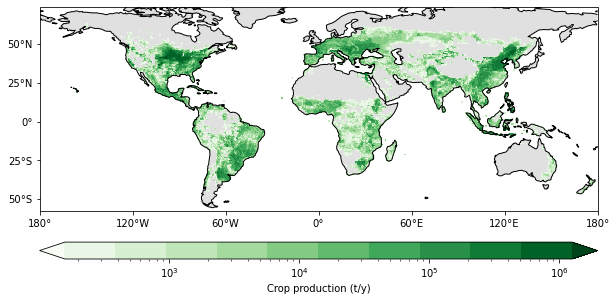

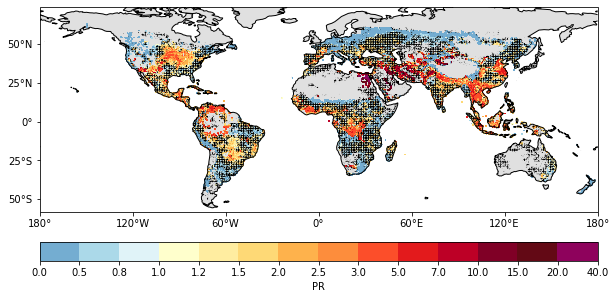

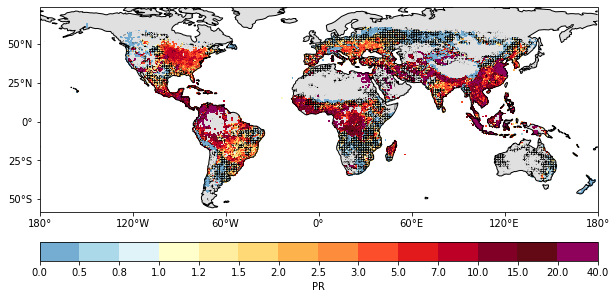

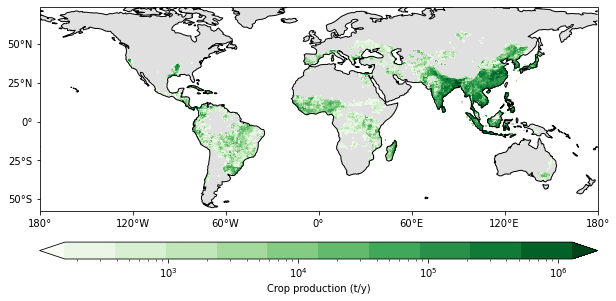

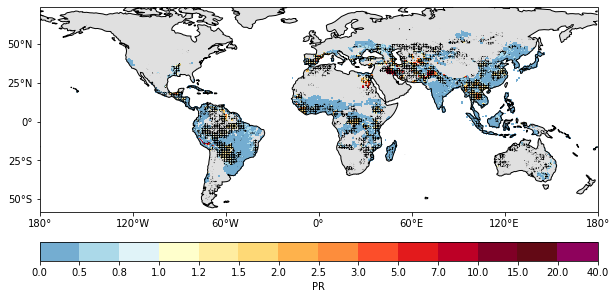

...

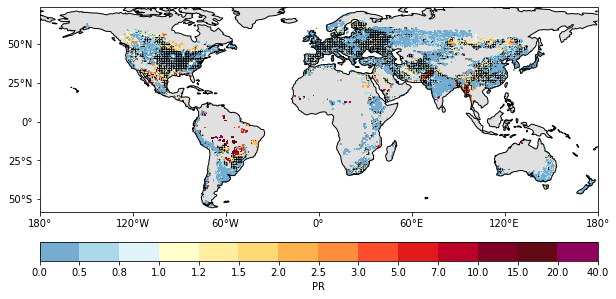

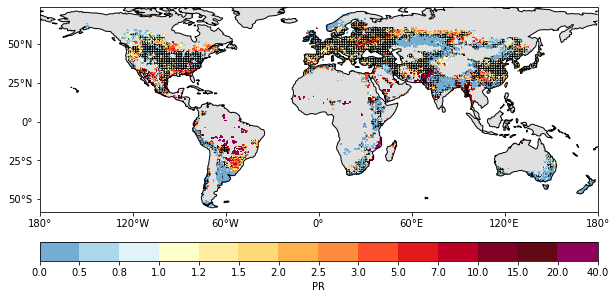

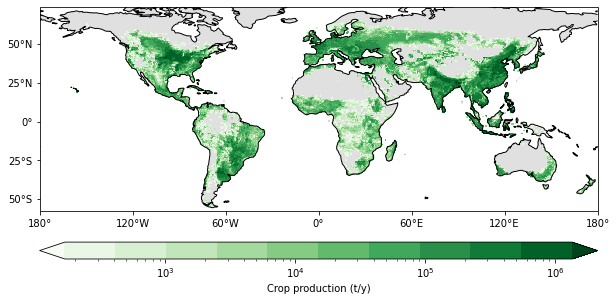

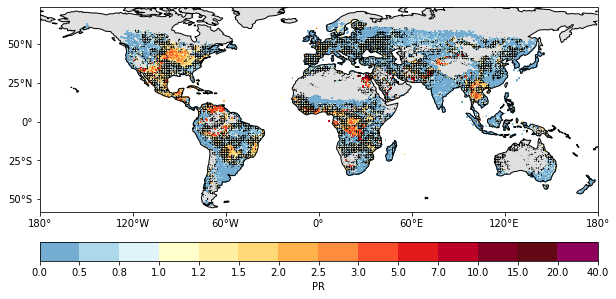

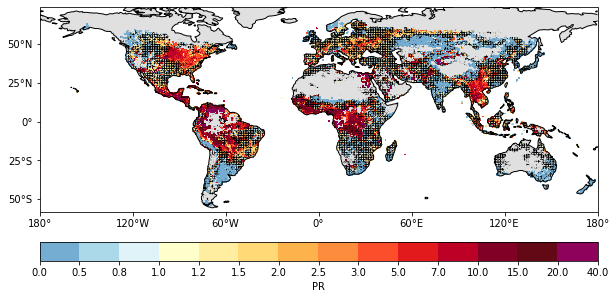

In [16]:
"""Plot gridded PR world maps"""
ref_bin = 0.5
gmt_bins = [2.0, 4.0]
gmt_bins = [ref_bin] + gmt_bins

show_title = False

agg_stat = 'median'
for crop in crops:
    for stat in stats:
        for gmt_bin in gmt_bins:
            if stat=='mean' and gmt_bin==ref_bin: # mean map reference GMT bin
                if show_title:
                    title = f'Mean production: {crop} {ref_bin}°C'
                else:
                    title = ''
                cbar_label = 'Crop production (t/y)'
                ups.plot_mat_stat_single(ds_dict[crop][gmt_bin][agg_stat][stat]['ref_self'], figsize=(10,6), title=title,
                             inverse=False, cmap='Greens', bbox=(-180, -58, 180, 74), log=True, levels='abs_80',
                             stipple=None, cbar_label=cbar_label)
                fn = f'map_grid_MeanProd_{crop}_{10*gmt_bin:02.0f}_tpy'

            if isinstance(stat, float) and (gmt_bin > ref_bin): # Probability Ration (PR) maps:
                if show_title:
                    title = f'PR {100*stat}th perc.: {crop} {gmt_bin}°C vs. {ref_bin}°C'
                else:
                    title = ''
                cbar_label = 'PR'
                ups.plot_mat_stat_single(ds_dict[crop][gmt_bin][agg_stat][stat]['PR'], figsize=(10,6), title=title,
                             inverse=False, cmap='PR', bbox=(-180, -58, 180, 74),
                             stipple=ds_dict[crop][gmt_bin]['sign_consistent'][stat]['PR'], hatches=['+++++', ''],
                             cbar_label=cbar_label)
                fn = f'map_grid_ProbRatio_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{100*stat}th_p'

            plt.savefig(co.res_dir / 'maps' / f'{fn}.png', dpi=300, \
                        facecolor='w', edgecolor='w', orientation='portrait', papertype=None, format='png', \
                        transparent=False, bbox_inches='tight', pad_inches=0.05, frameon=None, metadata=None)
            """plt.savefig(co.res_dir / 'maps' / f'{fn}.pdf', dpi=300, facecolor='w', edgecolor='w', \
                                             orientation='portrait', papertype=None, format='pdf', \
                                             transparent=False, bbox_inches=None, pad_inches=0.1, \
                                             frameon=None, metadata=None)"""

## B.1 Prepare data per country: tons per year
used below for world maps

In [13]:
"""Prepare data for world map with tons"""
%autoreload 2

irr = None # 'noirr_fullexp' # 'firr_fullexp' # None (all), firr, noirr, firr_fullexp, noirr_fullexp
## directory = Path('/Users/eberenzs/Documents/Projects/crop_analysis/data/ISIMIP3b/output/Stats_countries/overlapping_20210114/')
## directory = Path('/Users/eberenzs/Documents/Projects/crop_analysis/data/ISIMIP3b/output/Stats_countries/overlapping_20210124_detr_mean/')
##directory = Path('/Users/eberenzs/Documents/Projects/climada_papers_crop_production_risk_isimip/202103_crop_production_risk_isimip/data/ISIMIP3b/output/Stats_countries/overlapping')
# directory = Path('/Users/eberenzs/Documents/Projects/climada_papers_crop_production_risk_isimip/202103_crop_production_risk_isimip/data/ISIMIP3b/output/Stats_countries/overlapping/Detrended')
directory = DIRECTORY
#if irr:
#    directory = Path('/Users/eberenzs/Documents/Projects/crop_analysis/data/ISIMIP3b/output/Stats_countries/overlapping/') / irr

per_capita = False # default False for tons
pop_data_path = co.in_dir / 'worldbank_population_v2020.csv'
pop_year = '2018'

crops = co.crop_types_tons

ref_bin = 0.5
gmt_bins = [2.0, 3.0, 4.0]
gmt_bins = [ref_bin] + gmt_bins

# loop over crops, load stat DataFrames in dictionaries
df_self_dict = dict()
df_rel_dict = dict()
for crop in crops:
    #if ('combi' in crop) and co.input_version=='ISIMIP3b':
    #    ggcms_sel = co.ggcms['ISIMIP3b_allcrops']
    #else:
    ggcms_sel = None
    df_self_dict[crop], df_rel_dict[crop], fn_list = ups.load_country_stat_combi(crop=crop, ggcm=ggcms_sel, stat=None,
                                                            ref_bin=ref_bin, directory=directory,
                                                                                )
    print(fn_list)

countries = list(df_self_dict[crops[0]].columns[5:-1])
print(countries)

"""
## calc. coefficient of variation (CV):
for crop in crops:
    if ('combi' in crop) and co.input_version=='ISIMIP3b':
        ggcms_sel = np.sort(co.ggcms['ISIMIP3b_allcrops'])
    else:
        ggcms_sel = np.sort(df_self_dict[crop].ggcm.unique())
    for gmt_bin in list(df_self_dict[crop].bin.unique()):
        for ggcm in list(ggcms_sel):
            df_self_dict[crop] = df_self_dict[crop].append(df_self_dict[crop].loc[(df_self_dict[crop].bin==gmt_bin) & (df_self_dict[crop].ggcm==ggcm) & (df_self_dict[crop].stat=='std')], ignore_index=True)
            df_self_dict[crop].loc[df_self_dict[crop].index.max(), 'stat'] = 'CV'
            df_self_dict[crop].loc[df_self_dict[crop].index.max(), countries[0]:] = df_self_dict[crop].loc[df_self_dict[crop].index.max(), countries[0]:].values[0] / \
                df_self_dict[crop].loc[(df_self_dict[crop].bin==gmt_bin) & (df_self_dict[crop].ggcm==ggcm) & (df_self_dict[crop].stat=='mean'), countries[0]:].values[0]
    df_self_dict[crop].replace([np.inf, -np.inf], np.nan,inplace=True)
"""
if per_capita:
    # only for statistics in abs. values (t/y)
    stats_abs = [stat for stat in list(df_self_dict[crop].stat.unique()) if not 'count_rel_mean' in stat]
    pop_df = pd.read_csv(pop_data_path, encoding="ISO-8859-1", header=0)
    print(pop_df[pop_year].sum())
    # print(pop_df.columns)
    for cntry in countries:
        if pop_df.loc[pop_df['Country Code']==cntry, pop_year].size == 1:
            for crop in crops:
                for stat_abs in stats_abs:
                    df_self_dict[crop].loc[df_self_dict[crop].stat==stat_abs, cntry] = df_self_dict[crop].loc[df_self_dict[crop].stat==stat_abs, cntry] / pop_df.loc[pop_df['Country Code']==cntry, pop_year].values[0]
        else:
            for crop in crops:
                for stat_abs in stats_abs:
                    df_self_dict[crop].loc[df_self_dict[crop].stat==stat_abs, cntry] = np.nan
    for crop in crops: # global
        for stat_abs in stats_abs:
            df_self_dict[crop].loc[df_self_dict[crop].stat==stat_abs, 'GLB'] = df_self_dict[crop].loc[df_self_dict[crop].stat==stat_abs, 'GLB'] / pop_df.loc[pop_df['Country Code']=='WLD', pop_year].values[0]
        # df_self_dict[crop].loc[df_self_dict[crop].stat=='0.025'].plot.hist(bins=50, alpha=0.1) # mai: up to ca. 4e6 kcal pc
print(df_self_dict[crop].columns)
print(df_self_dict[crop].stat)
# print(stats_abs)

['stats_country_binned_self_mai.csv', 'stats_country_binned_rel2bin_05_mai.csv']
['stats_country_binned_self_ric.csv', 'stats_country_binned_rel2bin_05_ric.csv']
['stats_country_binned_self_soy.csv', 'stats_country_binned_rel2bin_05_soy.csv']
['stats_country_binned_self_whe.csv', 'stats_country_binned_rel2bin_05_whe.csv']
['stats_country_binned_self_combi-tons.csv', 'stats_country_binned_rel2bin_05_combi-tons.csv']
['AFG', 'ALB', 'ATA', 'DZA', 'AGO', 'AZE', 'ARG', 'AUS', 'AUT', 'BHS', 'BGD', 'ARM', 'BEL', 'BTN', 'BOL', 'BIH', 'BWA', 'BRA', 'BLZ', 'SLB', 'BRN', 'BGR', 'MMR', 'BDI', 'BLR', 'KHM', 'CMR', 'CAN', 'CPV', 'CYM', 'CAF', 'LKA', 'TCD', 'CHL', 'CHN', 'TWN', 'COL', 'COM', 'COG', 'COD', 'COK', 'CRI', 'HRV', 'CUB', 'CYP', 'CZE', 'BEN', 'DNK', 'DOM', 'ECU', 'SLV', 'GNQ', 'ETH', 'ERI', 'EST', 'FRO', 'FLK', 'SGS', 'FJI', 'FIN', 'ALA', 'FRA', 'PYF', 'ATF', 'DJI', 'GAB', 'GEO', 'GMB', 'PSE', 'DEU', 'GHA', 'KIR', 'GRC', 'GRL', 'GTM', 'GIN', 'GUY', 'HTI', 'HND', 'HKG', 'HUN', 'ISL', 'IND',

## B.2 Make world maps with production statistics per country in tons per year

/Users/eberenzs/Documents/Projects/climada_papers_crop_production_risk_isimip/202103_crop_production_risk_isimip/results/ISIMIP3b
irrigation scheme: None
['mean', 'CV']
mean
Mean annual production: mai 0.5°C


<ipython-input-14-affdb4a4a77e>:117: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


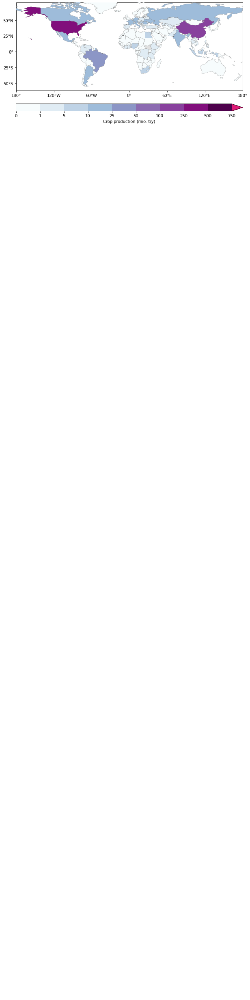

CV
mean
Mean annual production: ric 0.5°C


<ipython-input-14-affdb4a4a77e>:117: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


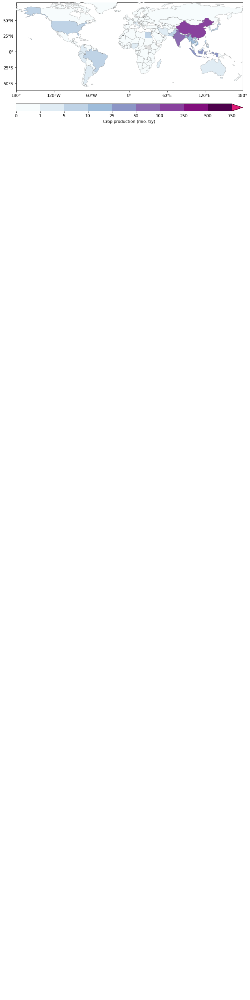

CV
mean
Mean annual production: soy 0.5°C


<ipython-input-14-affdb4a4a77e>:117: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


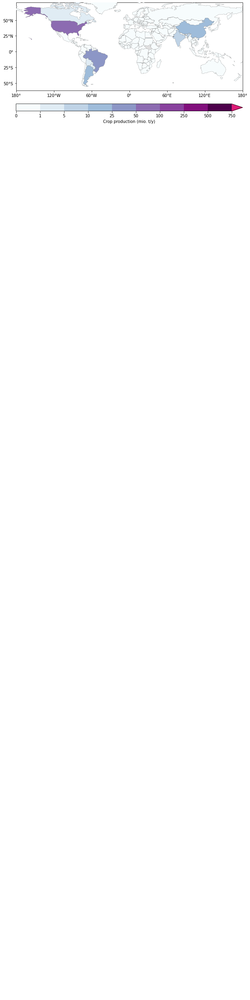

CV
mean
Mean annual production: whe 0.5°C


<ipython-input-14-affdb4a4a77e>:117: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


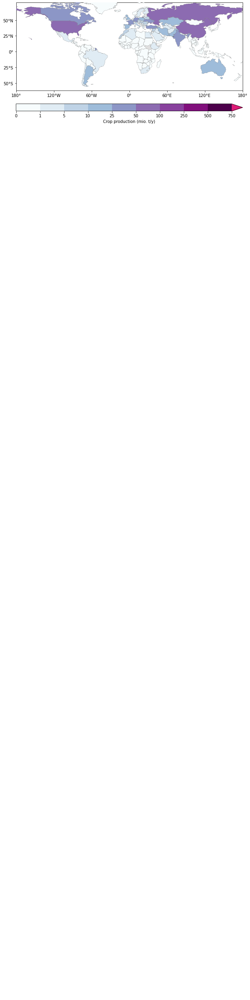

CV
mean
Mean annual production: combi 0.5°C


<ipython-input-14-affdb4a4a77e>:117: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


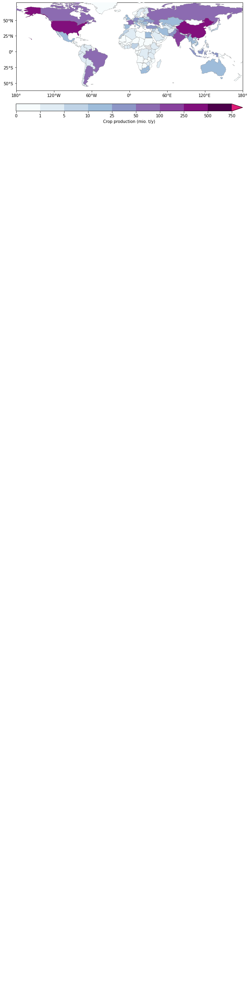

CV
$\Delta$ mean production: mai 2.0°C
40.99163659120947


KeyError: 'mai'

In [14]:
"""TONS make world map plot with color patch per country"""
# mean t, t at certain percentile, delta mean production, delta production at certain percentile
# requires cell above (loading stat data per country into dictionaries)
%autoreload 2
print(co.res_dir)
print(f'irrigation scheme: {irr}')
## settings for plots:
# 9 colors: https://colorbrewer2.org/?type=sequential&scheme=YlOrBr&n=9
colors9 = ['#f7fcfd','#e0ecf4','#bfd3e6','#9ebcda','#8c96c6','#8c6bb1','#88419d','#810f7c','#4d004b']
# colors12 = colors9 + ['#67001f', '#ae017e', '#dd1c77']
colors10 = colors9 + ['#dd1c77']
colors10_probability = ['#ffffcc','#ffeda0','#fed976','#feb24c','#fd8d3c','#fc4e2a','#e31a1c','#bd0026','#800026', '#630915'] # like  PR>1 scale
levels_abs = {'mean': # 10 levels
          {'mai': np.array([0, 1e6, 5e6, 10e6, 25e6, 50e6, 100e6, 250e6, 500e6, 750e6])*1e-6, #, 10e6, 12.5e6]), # mai: up to ca. 4e6 kcal pc
           'ric': np.array([0, 1e6, 5e6, 10e6, 25e6, 50e6, 100e6, 250e6, 500e6, 750e6])*1e-6, #, 10e6, 12.5e6]), # ric: up to ca. 5e6 kcal pc
           'soy': np.array([0, 1e6, 5e6, 10e6, 25e6, 50e6, 100e6, 250e6, 500e6, 750e6])*1e-6, #, 10e6, 12.5e6]), # soy: up to ca. 10e6 kcal pc
           'whe': np.array([0, 1e6, 5e6, 10e6, 25e6, 50e6, 100e6, 250e6, 500e6, 750e6])*1e-6, #, 10e6, 12.5e6]), # whe: up to ca. 10e6 kcal pc
           'combi-tons': np.array([0, 1e6, 5e6, 10e6, 25e6, 50e6, 100e6, 250e6, 500e6, 750e6])*1e-6, #, 10e6, 12.5e6]), # combi: # up to ca. 16e6 kcal pc
           'mai-kcal': np.array([0, 5e4, 1e5, 2.5e5, 5e5, 7.5e5, 1e6, 2.5e6, 5e6, 7.5e6]), #, 10e6, 12.5e6]), # mai: up to ca. 4e6 kcal pc
           'ric-kcal': np.array([0, 5e4, 1e5, 2.5e5, 5e5, 7.5e5, 1e6, 2.5e6, 5e6, 7.5e6]), #, 10e6, 12.5e6]), # ric: up to ca. 5e6 kcal pc
           'soy-kcal': np.array([0, 5e4, 1e5, 2.5e5, 5e5, 7.5e5, 1e6, 2.5e6, 5e6, 7.5e6]), #, 10e6, 12.5e6]), # soy: up to ca. 10e6 kcal pc
           'whe-kcal': np.array([0, 5e4, 1e5, 2.5e5, 5e5, 7.5e5, 1e6, 2.5e6, 5e6, 7.5e6]), #, 10e6, 12.5e6]), # whe: up to ca. 10e6 kcal pc
           'combi-kcal': np.array([0, 5e4, 1e5, 2.5e5, 5e5, 7.5e5, 1e6, 2.5e6, 5e6, 7.5e6]), #, 10e6, 12.5e6]), # combi: # up to ca. 16e6 kcal pc
          },
         }
levels_abs['0.025'] = levels_abs['mean']

levels_abs['CV'] = np.array([0, 0.05, .1, .015, .2, .25, .3, .4, .5, .6, .8]) # 11 levels
colors_CV = ['#ffffcc','#ffeda0','#fed976','#feb24c','#fd8d3c','#fc4e2a','#e31a1c','#bd0026','#800026', '#630915', '#8e025c'] # colors10_probability plus dark violett


colors12_div = ['#e31a1c', '#fc4e2a', '#fd8d3c', '#feb24c', '#fed976', '#ffeda0', # negative
                #'#7f3b08','#b35806','#e08214','#fdb863','#fee0b6', # negative
                '#f7f7f7','#d8daeb','#b2abd2','#8073ac','#542788','#2d004b'] # positive
levels_delta = {'mean': #
          {'mai': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'ric': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'soy': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'whe': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'combi-tons': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'mai-kcal': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'ric-kcal': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'soy-kcal': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'whe-kcal': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'combi-kcal': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
          },
         }
levels_delta['0.025'] = levels_delta['mean']
colors11_div_max = colors12_div[1:]
colors13_div_max = colors12_div + ['#2166ac']
levels_rel = {'mean': #
          {'mai-kcal': np.array([-100, -50, -30, -20, -10, -5, 0, 5, 10, 20, 30, 50, 100]),
           'ric-kcal': np.array([-100, -50, -30, -20, -10, -5, 0, 5, 10, 20, 30, 50, 100]),
           'soy-kcal': np.array([-100, -50, -30, -20, -10, -5, 0, 5, 10, 20, 30, 50, 100]),
           'whe-kcal': np.array([-100, -50, -30, -20, -10, -5, 0, 5, 10, 20, 30, 50, 100]),
           'combi-kcal': np.array([-100, -50, -30, -20, -10, -5, 0, 5, 10, 20, 30, 50, 100]),
          },
         }
levels_rel['0.025'] = levels_rel['mean']

stats = ['mean', 'CV']
crops = co.crop_types_tons
country_array = np.array(df_self_dict[crops[0]].columns[5:])


show_title = False

print(stats)
# absolute kcal (reference bin)
gmt_bin = ref_bin
for crop in crops:
    if 'kcal' in crop:
        crop_unit = 'kcal'
    else:
        crop_unit = 't'
    for stat in stats:
        print(stat)
        colors = colors10
        
        if stat=='mean':
            cbar_label = 'Crop production (mio. t/y)'
            colors = colors10
            title_str = 'Mean annual production: %s %1.1f°C'
            i_cntry_start = 3
            fn = f'map_countries_mean_{crop}_{10*gmt_bin:02.0f}_{stat}'
            levels = levels_abs[stat][crop]
            multipl = 1e-6
        elif stat=='CV':
            continue
            cbar_label = 'CV'
            colors = colors_CV
            title_str = 'CV: %s %1.1f°C'
            i_cntry_start = 3
            fn = f'map_countries_CV_{crop}_{10*gmt_bin:02.0f}_{stat}'
            levels = levels_abs[stat]
            multipl = 1
        elif isinstance(stat, float):
            cbar_label = 'Crop production (mio. t/y)'
            colors = colors10
            title_str = f'{100*stat}th percentile: %s %1.1f°C'
            stat = str(stat)
            i_cntry_start = 4
            fn = f'map_countries_mean_kcalpc_{crop}_{10*gmt_bin:02.0f}_{100*float(stat)}th_p'
            levels = levels_abs[stat][crop]
            multipl = 1e-6
        elif 'count_rel_mean' in stat:
            cbar_label = 'Crop production (mio. t/y)'
            colors = colors10
            dev_ = float(stat.split('-')[-1][:-1])
            title_str = f'Probability of production < {1-dev_:1.1f}*mean: %s %1.1f°C'
            i_cntry_start = 3
            fn = f'map_countries_prob_{crop}_{10*gmt_bin:02.0f}_{stat}'
            levels = np.array([0, .025, .05, .1, .15, .2, .3, .4, .5, .75]) # 10 levels
            colors = colors10_probability
            cbar_label = 'Probability'
            multipl = 1
        data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &
                                                             (df_self_dict[crop].bin==gmt_bin)].median()[i_cntry_start:].values) * multipl
        print(title_str %(crop.split('-')[0], gmt_bin))
        if show_title:
            title_str = title_str %(crop.split('-')[0], gmt_bin)
        else:
            title_str = ''
        fig_map, ax, countries_included, countries_excluded = \
            ups.plot_map_of_colored_countries(country_array, data_array, levels=levels,
                                              colors=colors, extent=None, figsize=(10,6),
                                              cbar_label=cbar_label,
                                              title=title_str, extend = 'max')
        fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_mean' / f'{fn}_irr_{irr}.pdf', dpi=300, \
                        facecolor='w', edgecolor='w', orientation='portrait',
                        format='pdf', transparent=False, pad_inches=0.05, metadata=None)
        fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_mean' / f'{fn}_irr_{irr}.png', dpi=300, \
                        facecolor='w', edgecolor='w', orientation='portrait',
                        format='png', transparent=False, pad_inches=0.05, metadata=None)

        #fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_mean' / f'{fn}_irr_{irr}.pdf', dpi=300, \
        #                facecolor='w', edgecolor='w', orientation='portrait', papertype=None, format='pdf', \
        #                transparent=False, bbox_inches='tight', pad_inches=0.05, frameon=None, metadata=None)
        #fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_mean' / f'{fn}_irr_{irr}.png', dpi=300, \
        #                facecolor='w', edgecolor='w', orientation='portrait', papertype=None, format='png', \
        #                transparent=False, bbox_inches='tight', pad_inches=0.05, frameon=None, metadata=None)


# delta
"""
for gmt_bin in gmt_bins[1:]:
    for crop in crops:
        for stat in stats:
            if stat=='mean':
                title_str = '$\Delta$ mean annual production: %s %1.1f°C'
                i_cntry_start = 3
                fn = f'map_countries_delta_kcalpc_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{stat}'
            elif isinstance(stat, float):
                title_str = f'$\Delta$ {100*stat}th percentile: %s %1.1f°C'
                stat = str(stat)
                i_cntry_start = 3
                fn = f'map_countries_delta_kcalpc_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{100*float(stat)}th_p'
            elif 'count_rel_mean' in stat:
                continue
            df_ref_ = df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) & (df_self_dict[crop].bin==ref_bin)].reset_index(drop=True).select_dtypes(np.number)
            df_ = df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) & (df_self_dict[crop].bin==gmt_bin)].reset_index(drop=True).select_dtypes(np.number)
            # subtraction: df - df_ref:
            df_result = df_.sub(df_ref_)
            data_array = np.nan_to_num(df_result.median()[i_cntry_start:].values)
            # divided at 0, as we are recording positive and negative changes
            ggcm_consistency_array = ((df_result > 0).sum() > .7*df_result.shape[0])[i_cntry_start:].values + ((df_result < 0).sum() > .7*df_result.shape[0])[i_cntry_start:].values
            print(title_str %(crop.split('-')[0], gmt_bin))
            if show_title:
                title_str = title_str %(crop.split('-')[0], gmt_bin)
            else:
                title_str = ''
            
            fig_map, ax, countries_included, countries_excluded = \
                ups.plot_map_of_colored_countries(country_array, data_array, levels=levels_delta[stat][crop],
                                                  colors=colors12_div, extent=None, figsize=(10,6),
                                                  title=title_str,
                                                  cbar_label='kcal / capita / year', extend='both',
                                                  hatches = ggcm_consistency_array)    
            fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_mean' / f'{fn}_irr_{irr}.pdf', dpi=300, \
                            facecolor='w', edgecolor='w', orientation='portrait',
                            format='pdf', transparent=False, pad_inches=0.05, metadata=None)
            fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_mean' / f'{fn}_irr_{irr}.png', dpi=300, \
                            facecolor='w', edgecolor='w', orientation='portrait',
                            format='png', transparent=False, pad_inches=0.05, metadata=None)
            
# relative (%)
for gmt_bin in gmt_bins[1:]:
    for crop in crops:
        for stat in stats:
            if stat=='mean':
                title_str = '$\Delta$ mean production: %s %1.1f°C'
                i_cntry_start = 3
                fn = f'map_countries_rel_delta_kcal_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{stat}'
            elif isinstance(stat, float):
                title_str = f'$\Delta$ {100*stat}th percentile: %s %1.1f°C'
                stat = str(stat)
                i_cntry_start = 3
                fn = f'map_countries_rel_delta_kcal_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{100*float(stat)}th_p'
            elif 'count_rel_mean' in stat:
                continue
            
            df_ref_ = df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) & (df_self_dict[crop].bin==ref_bin)].reset_index(drop=True).select_dtypes(np.number)
            df_ = df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) & (df_self_dict[crop].bin==gmt_bin)].reset_index(drop=True).select_dtypes(np.number)
            # rel. diff: (df_ - df_ref_) / df_ref_:
            df_result = df_.sub(df_ref_).div(df_ref_)
            data_array = 100 * np.nan_to_num(df_result.median()[i_cntry_start:].values)
            ggcm_consistency_array = ((df_result > 0).sum() > .7*df_result.shape[0])[i_cntry_start:].values + ((df_result < 0).sum() > .7*df_result.shape[0])[i_cntry_start:].values
            
            print(title_str %(crop.split('-')[0], gmt_bin))
            print(max(data_array))
            data_array[data_array == np.inf] = np.nan
            data_array[data_array == -np.inf] = np.nan
            
            if show_title:
                title_str = title_str %(crop.split('-')[0], gmt_bin)
            else:
                title_str = ''

            fig_map, ax, countries_included, countries_excluded = \
                ups.plot_map_of_colored_countries(country_array, data_array, levels=levels_rel[stat][crop],
                                                  colors=colors13_div_max, extent=None, figsize=(10,6),
                                                  title=title_str, 
                                                  cbar_label='Relative change (%)', extend='max',
                                                  hatches = ggcm_consistency_array) 
            fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_mean' / f'{fn}_irr_{irr}.pdf', dpi=300, \
                            facecolor='w', edgecolor='w', orientation='portrait',
                            format='pdf', transparent=False, pad_inches=0.05, metadata=None)
            fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_mean' / f'{fn}_irr_{irr}.png', dpi=300, \
                            facecolor='w', edgecolor='w', orientation='portrait',
                            format='png', transparent=False, pad_inches=0.05, metadata=None)

# probability ratio (%)  

# print(countries_included)
# print(countries_excluded)
"""

## B.3 Prepare data for world map with kcal per capita risk profile

In [3]:
""""""
%autoreload 2

irr = None # 'noirr_fullexp' # 'firr_fullexp' # None (all), firr, noirr, firr_fullexp, noirr_fullexp
# directory = Path('/Users/eberenzs/Documents/Projects/crop_analysis/data/ISIMIP3b/output/Stats_countries/overlapping_20210114/')
# directory = Path('/Users/eberenzs/Documents/Projects/crop_analysis/data/ISIMIP3b/output/Stats_countries/overlapping_20210124_detr_mean/')
directory = DIRECTORY
if irr:
    print('warning: for irr other than None (default), kcal is not yet updated')
    directory = Path('/Users/eberenzs/Documents/Projects/crop_analysis/data/ISIMIP3b/output/Stats_countries/overlapping/') / irr

per_capita = False
pop_data_path = co.in_dir / 'worldbank_population_v2020.csv'
pop_year = '2018'

crops = co.crop_types_kcal

ref_bin = 0.5
gmt_bins = [2.0, 4.0]
gmt_bins = [ref_bin] + gmt_bins

# loop over crops, load stat DataFrames in dictionaries
df_self_dict = dict()
df_rel_dict = dict()
for crop in crops:
    if ('combi' in crop) and co.input_version=='ISIMIP3b':
        ggcms_sel = co.ggcms['ISIMIP3b_allcrops']
    else:
        ggcms_sel = None
    df_self_dict[crop], df_rel_dict[crop], fn_list = ups.load_country_stat_combi(crop=crop, ggcm=ggcms_sel, stat=None,
                                                            ref_bin=ref_bin, directory=directory,
                                                                                )
    print(fn_list)

countries = list(df_self_dict[crops[0]].columns[5:-1])
print(countries)
if per_capita:
    # only for statistics in abs. values (t/y)
    stats_abs = [stat for stat in list(df_self_dict[crop].stat.unique()) if not 'count_rel_mean' in stat]
    pop_df = pd.read_csv(pop_data_path, encoding="ISO-8859-1", header=0)
    print(pop_df[pop_year].sum())
    # print(pop_df.columns)
    for cntry in countries:
        if pop_df.loc[pop_df['Country Code']==cntry, pop_year].size == 1:
            for crop in crops:
                for stat_abs in stats_abs:
                    df_self_dict[crop].loc[df_self_dict[crop].stat==stat_abs, cntry] = df_self_dict[crop].loc[df_self_dict[crop].stat==stat_abs, cntry] / pop_df.loc[pop_df['Country Code']==cntry, pop_year].values[0]
        else:
            for crop in crops:
                for stat_abs in stats_abs:
                    df_self_dict[crop].loc[df_self_dict[crop].stat==stat_abs, cntry] = np.nan
    for crop in crops: # global
        for stat_abs in stats_abs:
            df_self_dict[crop].loc[df_self_dict[crop].stat==stat_abs, 'GLB'] = df_self_dict[crop].loc[df_self_dict[crop].stat==stat_abs, 'GLB'] / pop_df.loc[pop_df['Country Code']=='WLD', pop_year].values[0]
        # df_self_dict[crop].loc[df_self_dict[crop].stat=='0.025'].plot.hist(bins=50, alpha=0.1) # mai: up to ca. 4e6 kcal pc
# print(df_self_dict[crop].columns)
# print(df_self_dict[crop].stat)
# print(stats_abs)
print(df_self_dict['mai-kcal'].ggcm.unique())
print(df_self_dict['ric-kcal'].ggcm.unique())
print(df_self_dict['soy-kcal'].ggcm.unique())
print(df_self_dict['whe-kcal'].ggcm.unique())

['stats_country_binned_self_mai-kcal.csv', 'stats_country_binned_rel2bin_05_mai-kcal.csv']
['stats_country_binned_self_ric-kcal.csv', 'stats_country_binned_rel2bin_05_ric-kcal.csv']
['stats_country_binned_self_soy-kcal.csv', 'stats_country_binned_rel2bin_05_soy-kcal.csv']
['stats_country_binned_self_whe-kcal.csv', 'stats_country_binned_rel2bin_05_whe-kcal.csv']
['stats_country_binned_self_combi-kcal.csv', 'stats_country_binned_rel2bin_05_combi-kcal.csv']
['AFG', 'ALB', 'ATA', 'DZA', 'AGO', 'AZE', 'ARG', 'AUS', 'AUT', 'BHS', 'BGD', 'ARM', 'BEL', 'BTN', 'BOL', 'BIH', 'BWA', 'BRA', 'BLZ', 'SLB', 'BRN', 'BGR', 'MMR', 'BDI', 'BLR', 'KHM', 'CMR', 'CAN', 'CPV', 'CYM', 'CAF', 'LKA', 'TCD', 'CHL', 'CHN', 'TWN', 'COL', 'COM', 'COG', 'COD', 'COK', 'CRI', 'HRV', 'CUB', 'CYP', 'CZE', 'BEN', 'DNK', 'DOM', 'ECU', 'SLV', 'GNQ', 'ETH', 'ERI', 'EST', 'FRO', 'FLK', 'SGS', 'FJI', 'FIN', 'ALA', 'FRA', 'PYF', 'ATF', 'DJI', 'GAB', 'GEO', 'GMB', 'PSE', 'DEU', 'GHA', 'KIR', 'GRC', 'GRL', 'GTM', 'GIN', 'GUY', '

## B.4 Make world maps with production statistics per country in kcal per capita

irrigation scheme: None
['mean', 0.025, "('count_rel_mean', -0.1)", "('count_rel_mean', -0.2)"]
mean
Mean annual production: mai 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


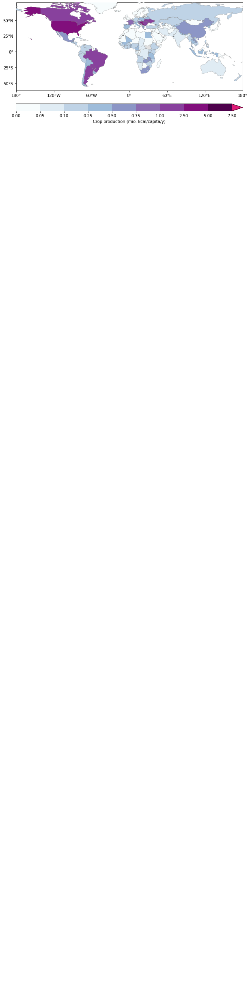

0.025
2.5th percentile: mai 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


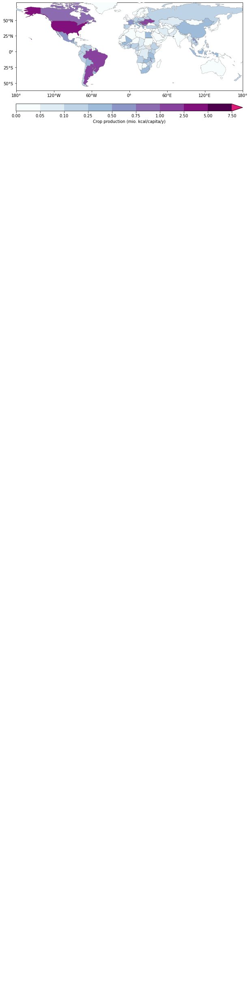

('count_rel_mean', -0.1)
Probability of production < 0.9*mean: mai 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


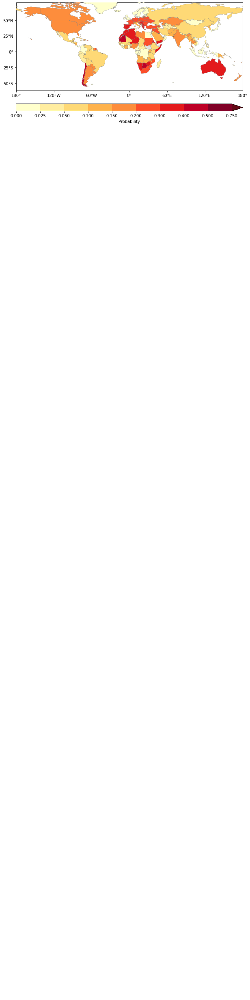

('count_rel_mean', -0.2)
Probability of production < 0.8*mean: mai 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


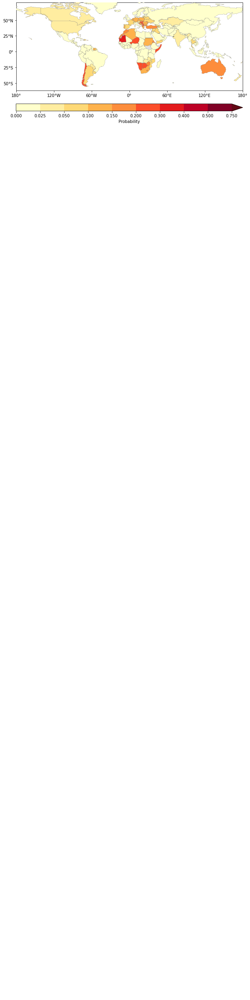

mean
Mean annual production: ric 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


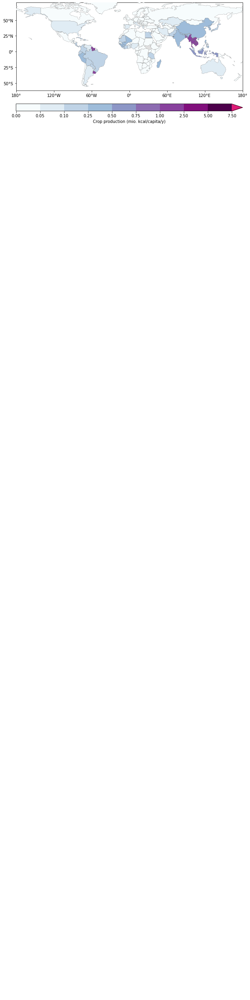

0.025
2.5th percentile: ric 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


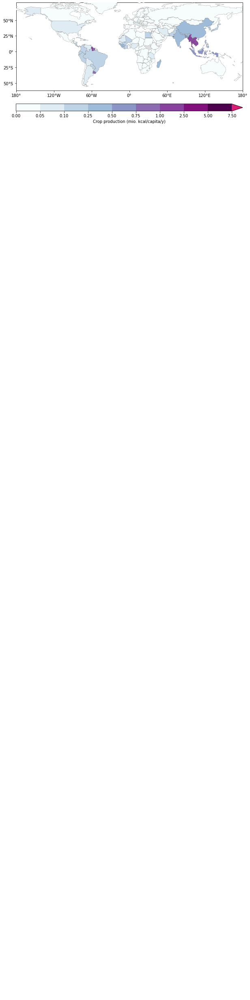

('count_rel_mean', -0.1)
Probability of production < 0.9*mean: ric 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


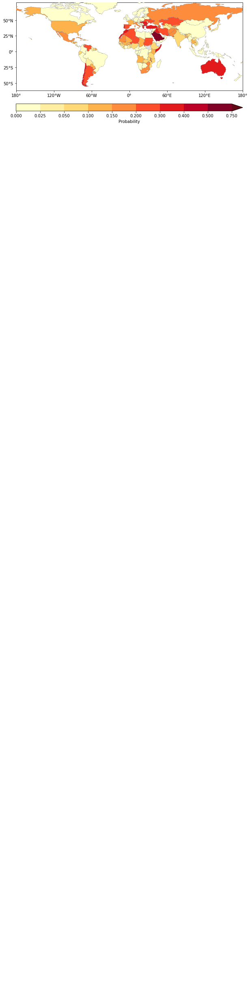

('count_rel_mean', -0.2)
Probability of production < 0.8*mean: ric 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


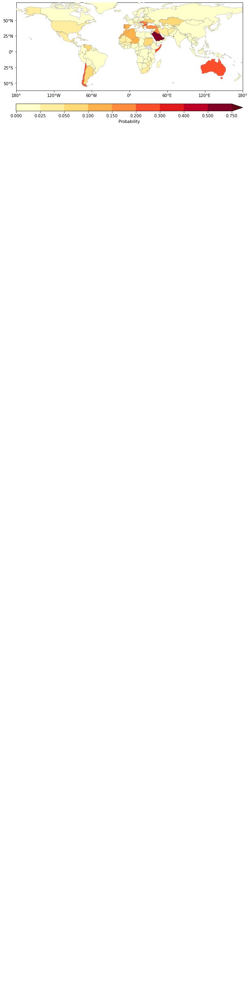

mean
Mean annual production: soy 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


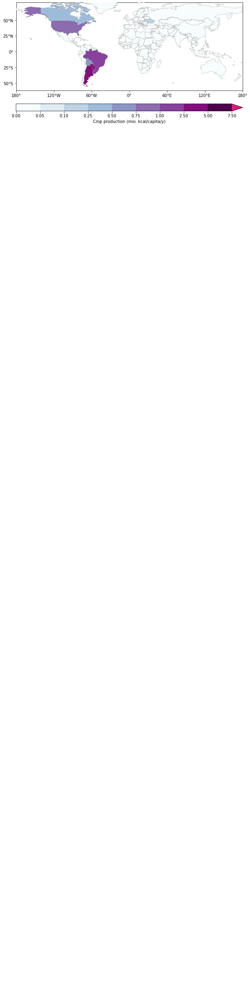

0.025
2.5th percentile: soy 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


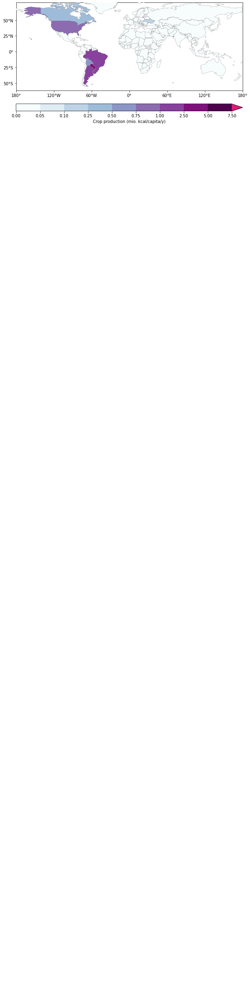

('count_rel_mean', -0.1)
Probability of production < 0.9*mean: soy 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


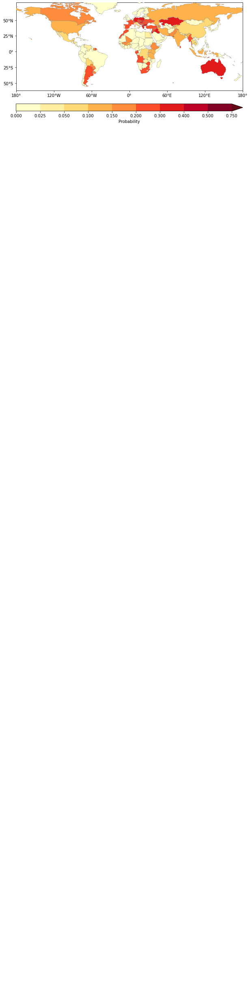

('count_rel_mean', -0.2)
Probability of production < 0.8*mean: soy 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


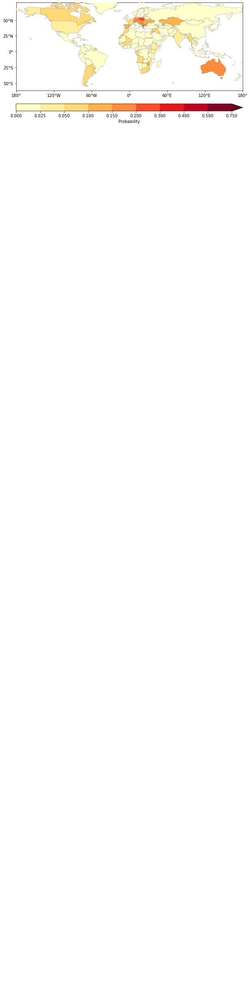

mean
Mean annual production: whe 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


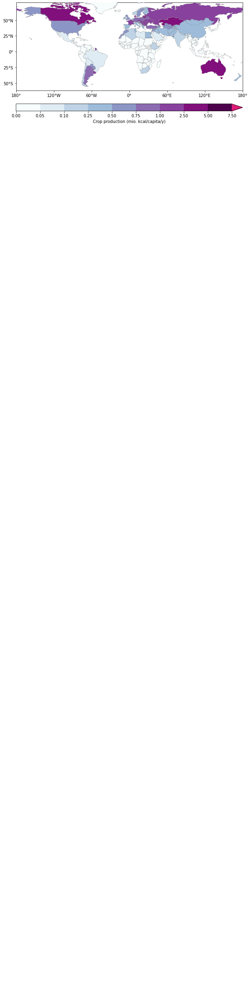

0.025
2.5th percentile: whe 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


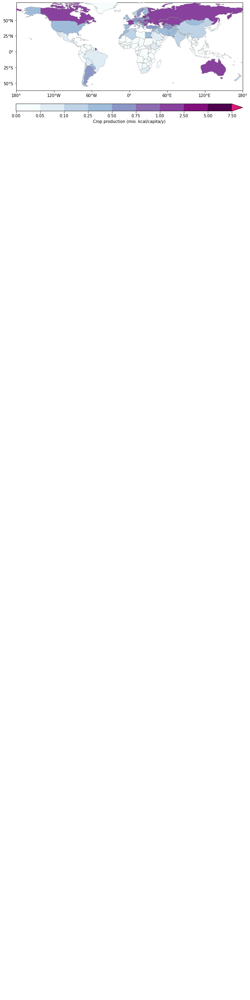

('count_rel_mean', -0.1)
Probability of production < 0.9*mean: whe 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


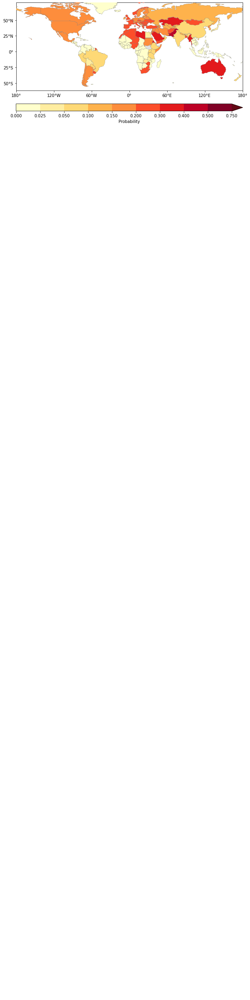

('count_rel_mean', -0.2)
Probability of production < 0.8*mean: whe 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


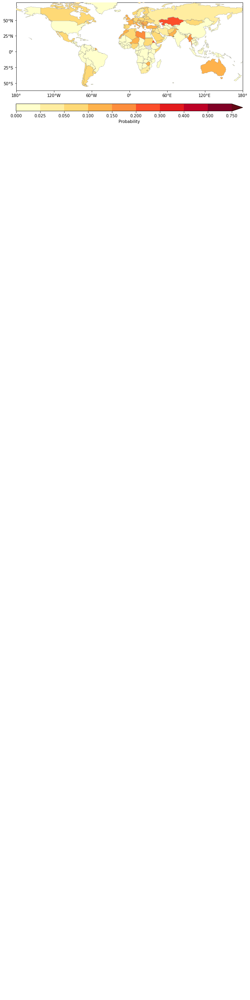

mean
Mean annual production: combi 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


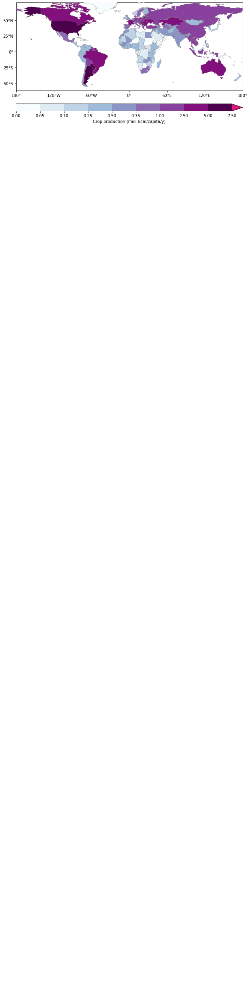

0.025
2.5th percentile: combi 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


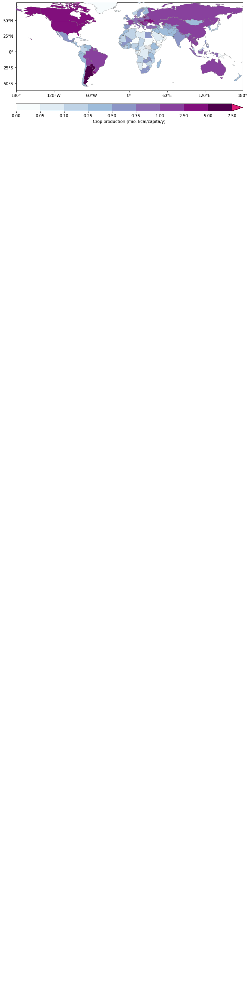

('count_rel_mean', -0.1)
Probability of production < 0.9*mean: combi 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


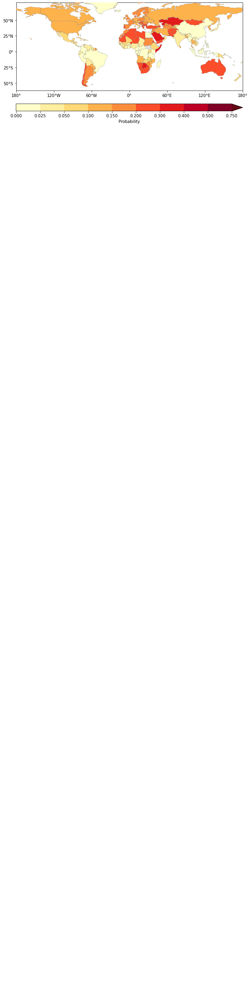

('count_rel_mean', -0.2)
Probability of production < 0.8*mean: combi 0.5°C


<ipython-input-16-80b1b4cea1eb>:88: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &


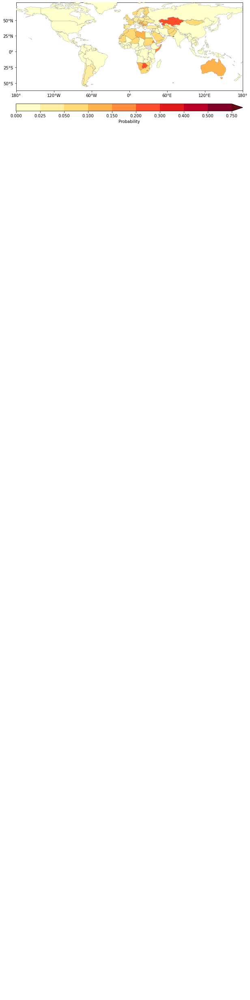

$\Delta$ mean annual production: mai 2.0°C


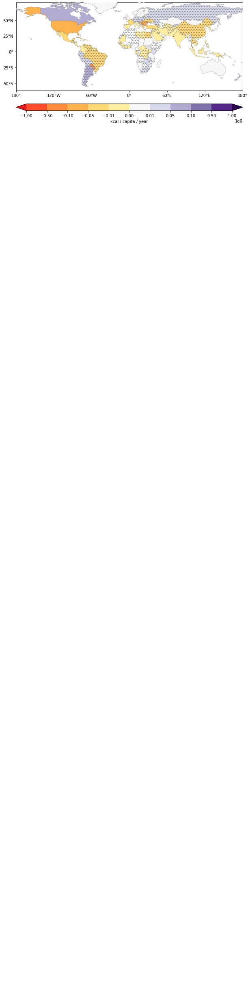

<ipython-input-16-80b1b4cea1eb>:142: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig_map.savefig(co.res_dir / 'maps' / f'{fn}_irr_{irr}.png', dpi=300, \
<ipython-input-16-80b1b4cea1eb>:142: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig_map.savefig(co.res_dir / 'maps' / f'{fn}_irr_{irr}.png', dpi=300, \


$\Delta$ 2.5th percentile: mai 2.0°C


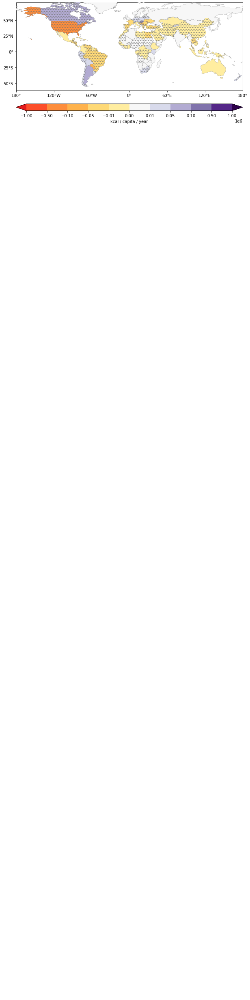

$\Delta$ mean annual production: ric 2.0°C


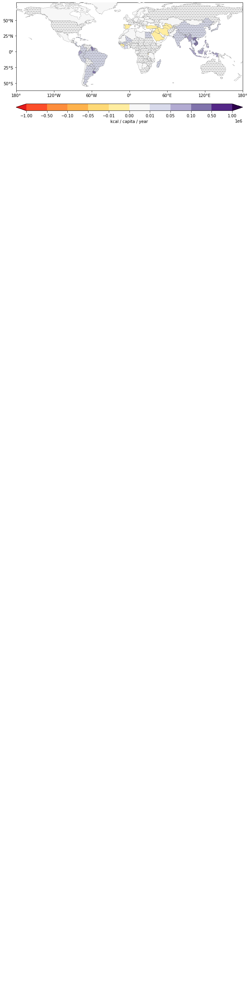

$\Delta$ 2.5th percentile: ric 2.0°C


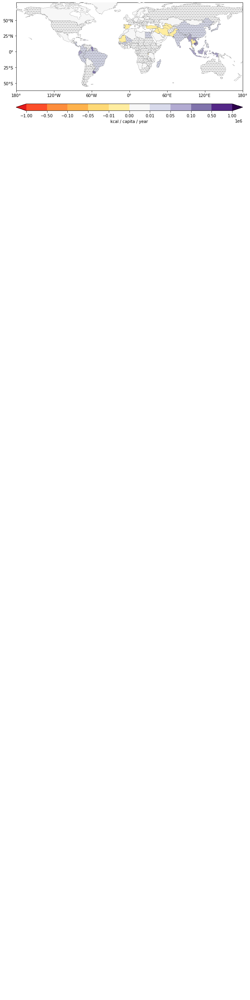

$\Delta$ mean annual production: soy 2.0°C


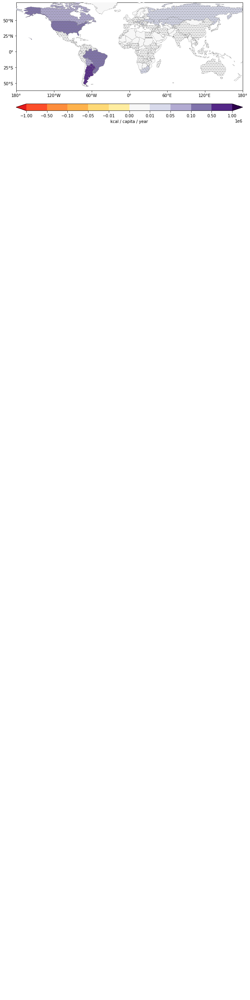

$\Delta$ 2.5th percentile: soy 2.0°C


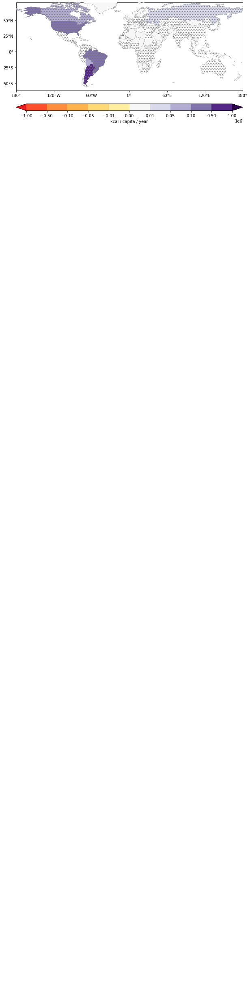

$\Delta$ mean annual production: whe 2.0°C


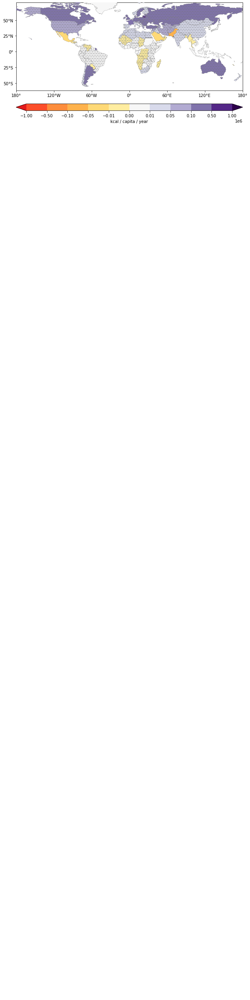

$\Delta$ 2.5th percentile: whe 2.0°C


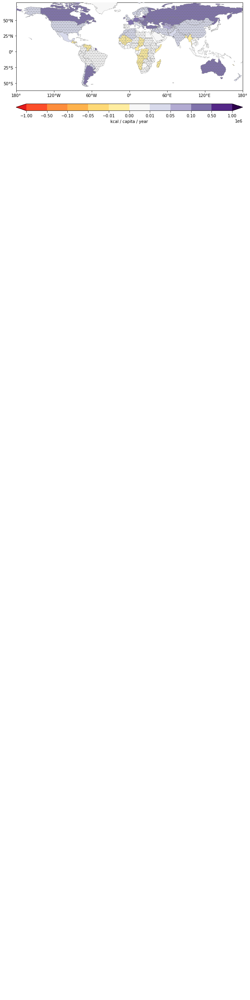

$\Delta$ mean annual production: combi 2.0°C


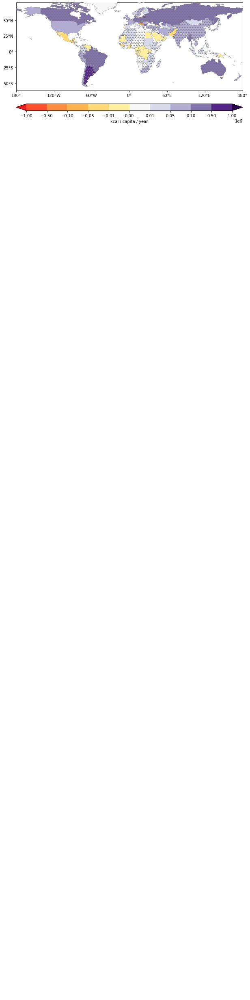

$\Delta$ 2.5th percentile: combi 2.0°C


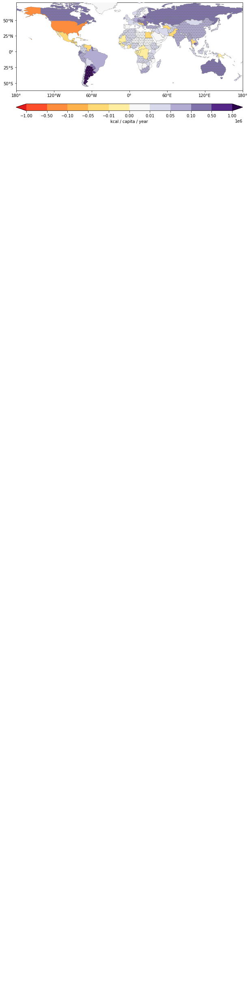

$\Delta$ mean annual production: mai 4.0°C


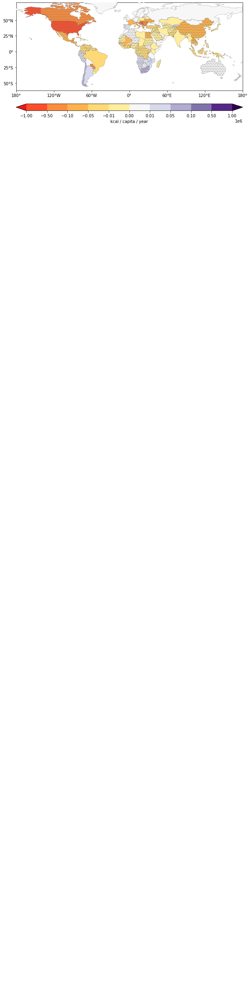

$\Delta$ 2.5th percentile: mai 4.0°C


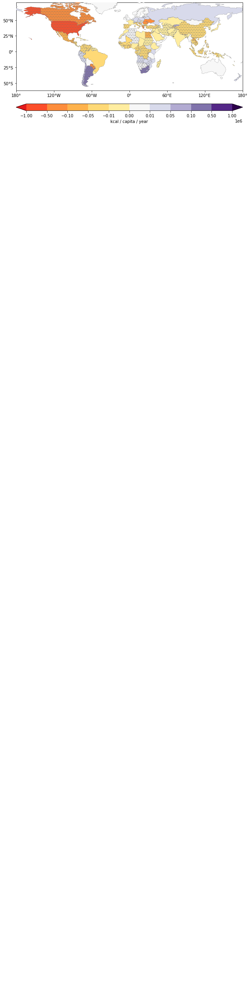

$\Delta$ mean annual production: ric 4.0°C


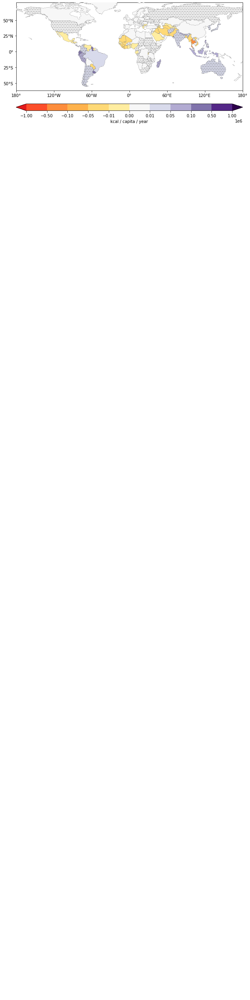

$\Delta$ 2.5th percentile: ric 4.0°C


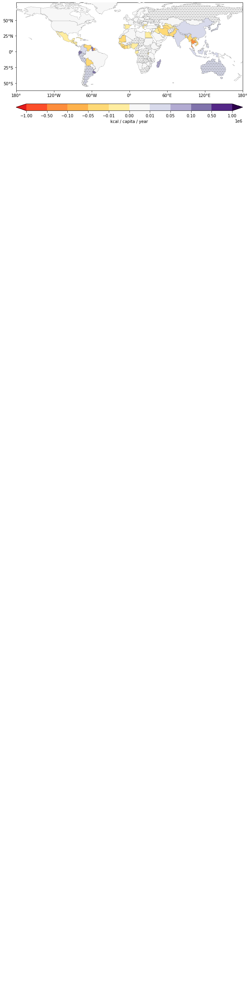

$\Delta$ mean annual production: soy 4.0°C


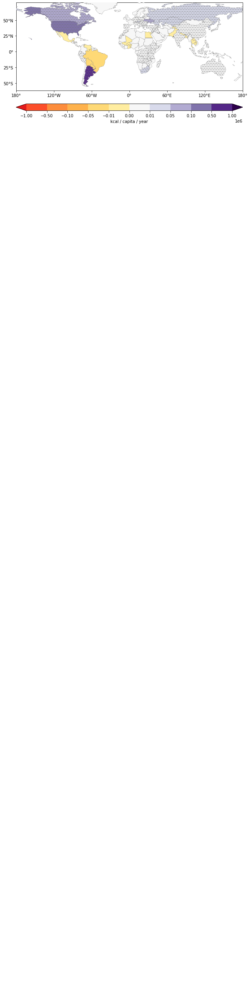

$\Delta$ 2.5th percentile: soy 4.0°C


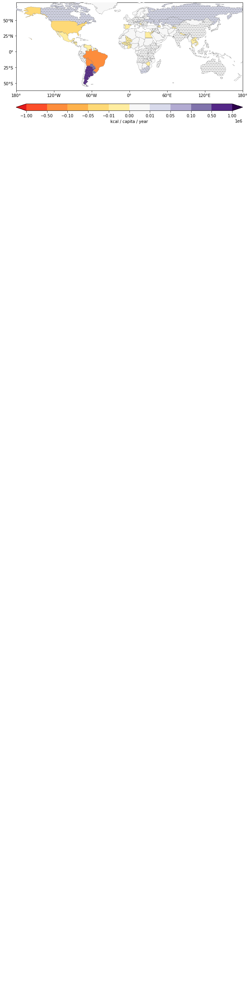

$\Delta$ mean annual production: whe 4.0°C


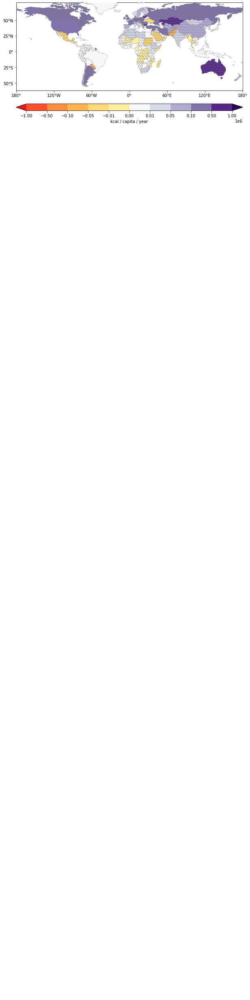

$\Delta$ 2.5th percentile: whe 4.0°C


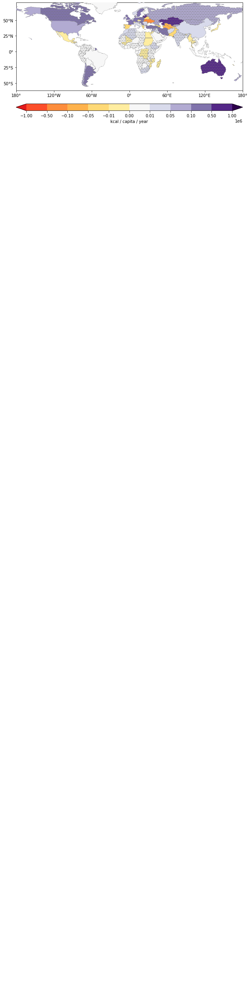

$\Delta$ mean annual production: combi 4.0°C


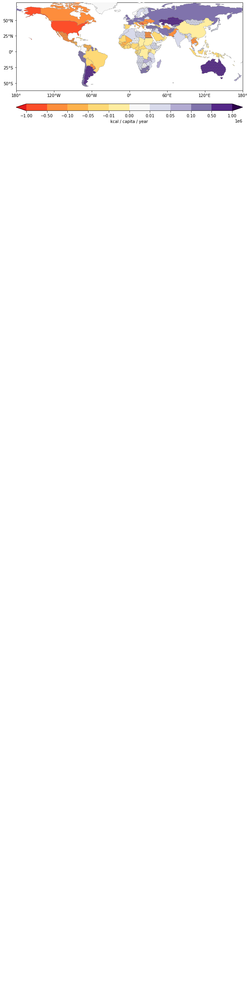

$\Delta$ 2.5th percentile: combi 4.0°C


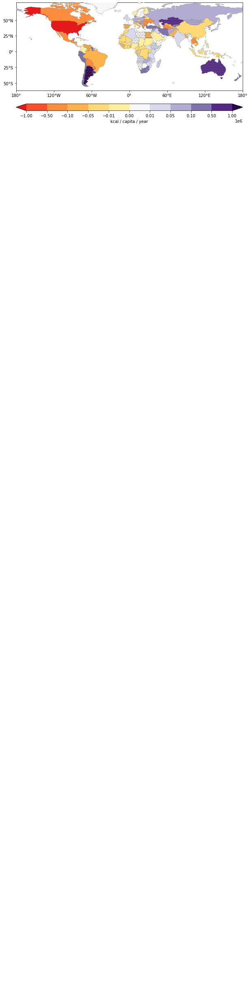

$\Delta$ mean production: mai 2.0°C
21.953223767958583


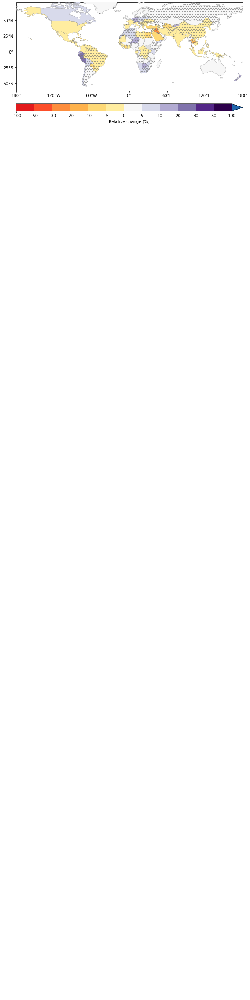

<ipython-input-16-80b1b4cea1eb>:185: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig_map.savefig(co.res_dir / 'maps' / f'{fn}_irr_{irr}.png', dpi=300, \
<ipython-input-16-80b1b4cea1eb>:185: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig_map.savefig(co.res_dir / 'maps' / f'{fn}_irr_{irr}.png', dpi=300, \


$\Delta$ 2.5th percentile: mai 2.0°C
40.19592857333116


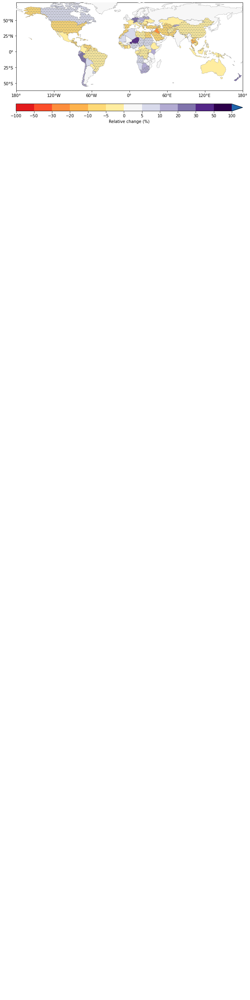

$\Delta$ mean production: ric 2.0°C
39.54637342390676


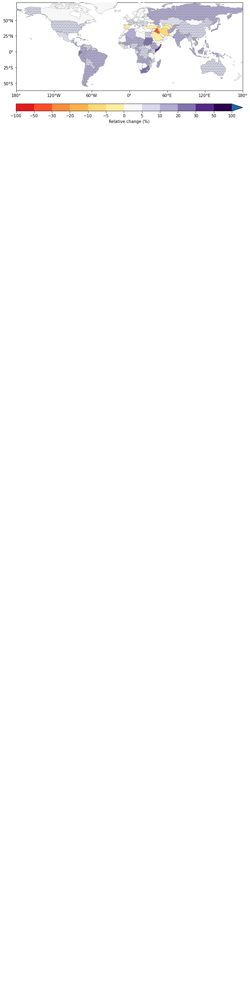

$\Delta$ 2.5th percentile: ric 2.0°C
33.032028461544


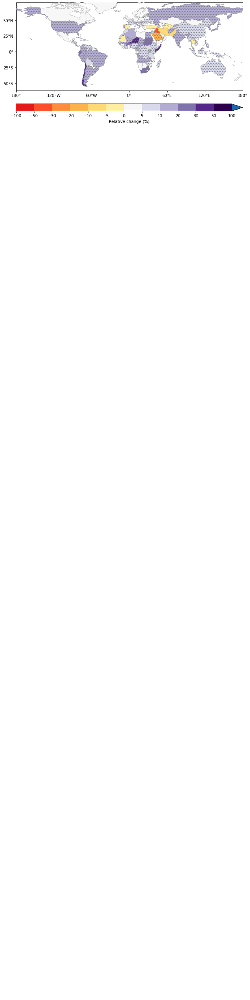

$\Delta$ mean production: soy 2.0°C
42.26480271301189


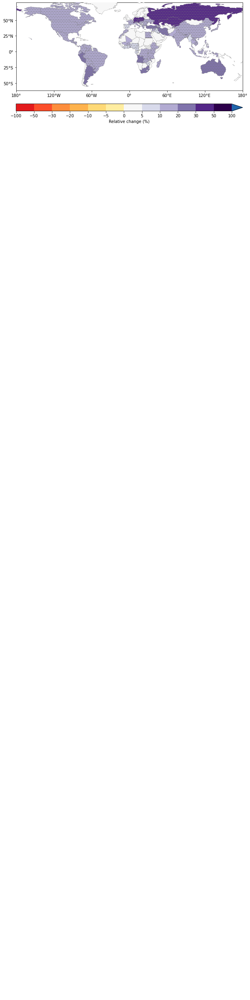

$\Delta$ 2.5th percentile: soy 2.0°C
73.18485174943457


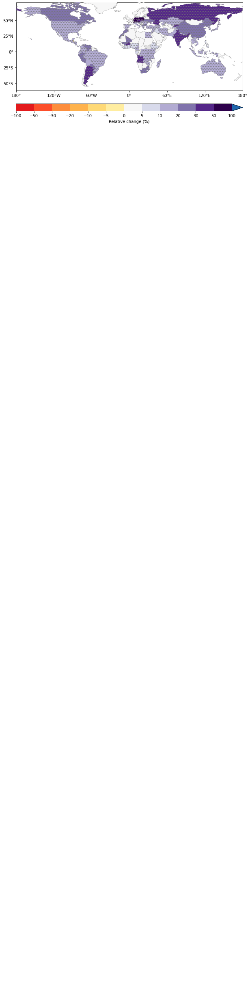

$\Delta$ mean production: whe 2.0°C
28.083565333752347


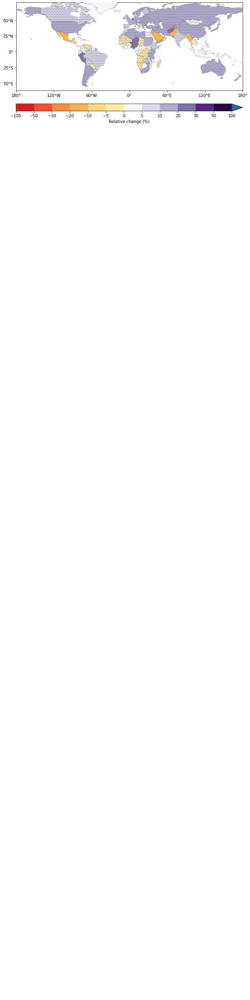

$\Delta$ 2.5th percentile: whe 2.0°C
37.473014534173466


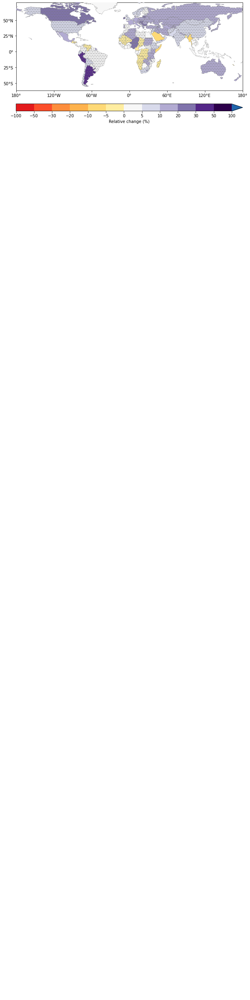

$\Delta$ mean production: combi 2.0°C
24.3230762404217


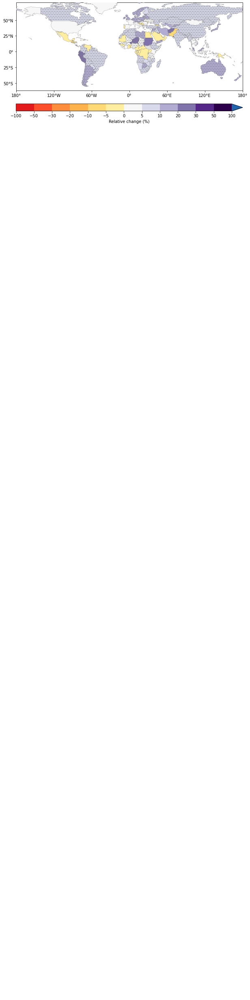

$\Delta$ 2.5th percentile: combi 2.0°C
35.07525260913149


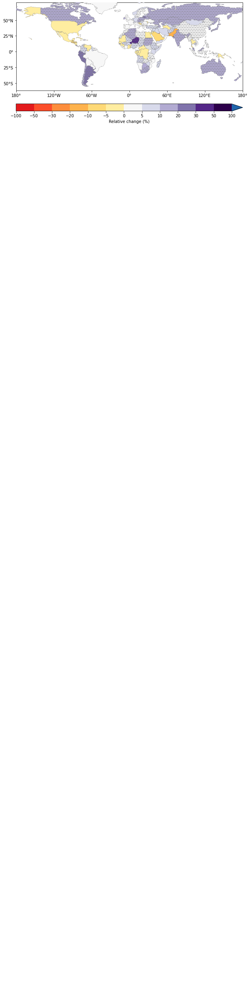

$\Delta$ mean production: mai 4.0°C
43.48535941651892


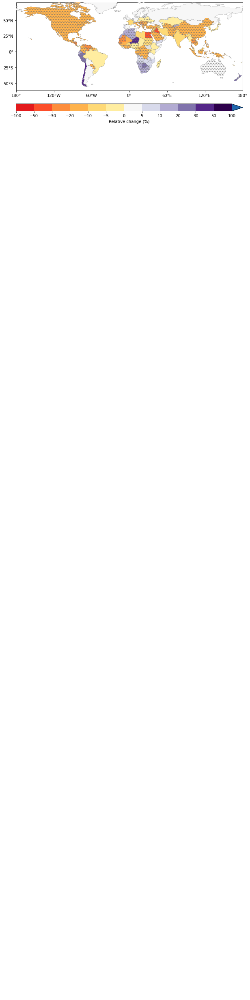

$\Delta$ 2.5th percentile: mai 4.0°C
74.18126764378444


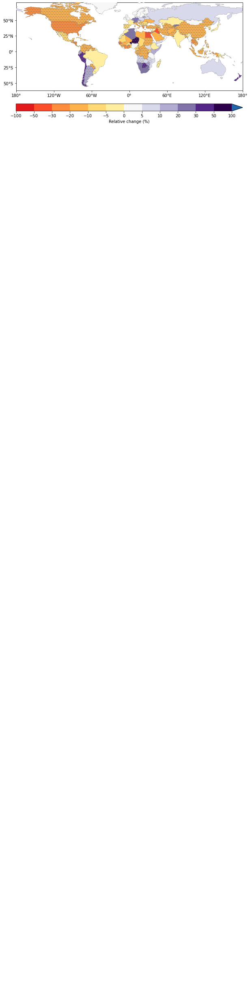

$\Delta$ mean production: ric 4.0°C
104.35253611873863


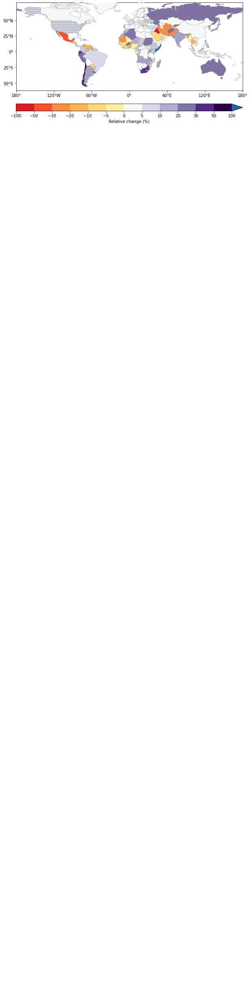

$\Delta$ 2.5th percentile: ric 4.0°C
137.69843204400271


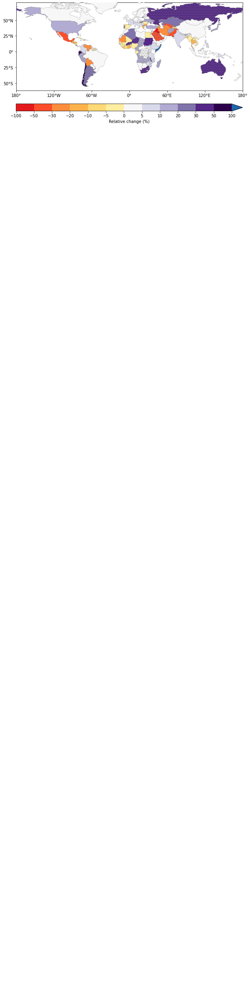

$\Delta$ mean production: soy 4.0°C
72.0644296921958


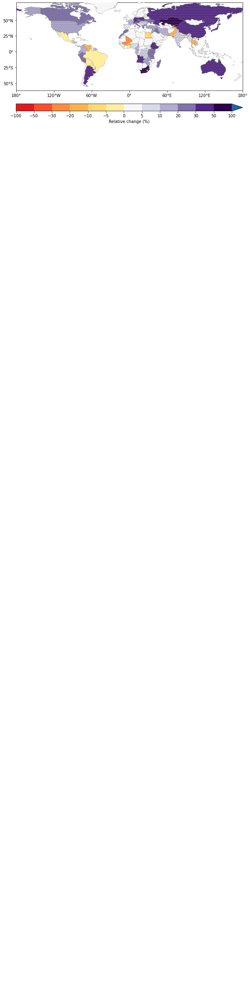

$\Delta$ 2.5th percentile: soy 4.0°C
90.82557212648598


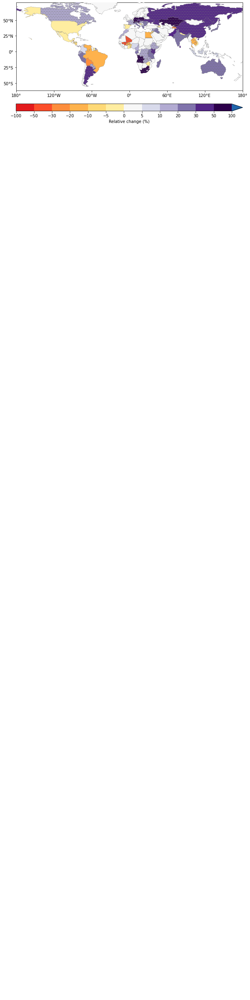

$\Delta$ mean production: whe 4.0°C
41.96572391124834


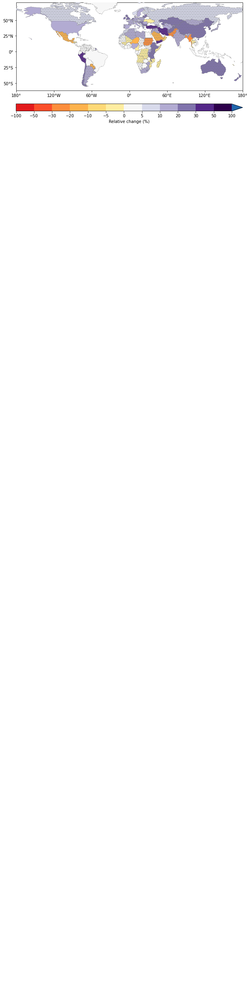

$\Delta$ 2.5th percentile: whe 4.0°C
54.10191933514095


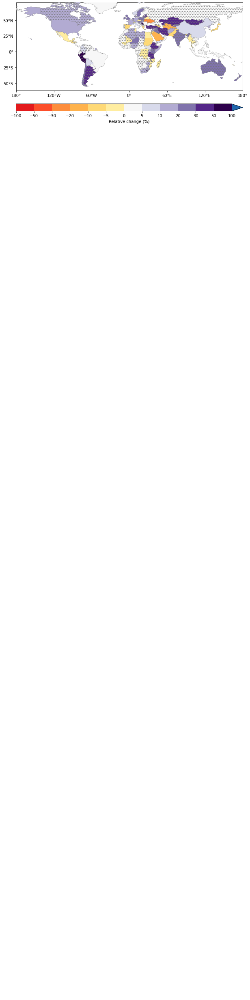

$\Delta$ mean production: combi 4.0°C
42.48992635989705


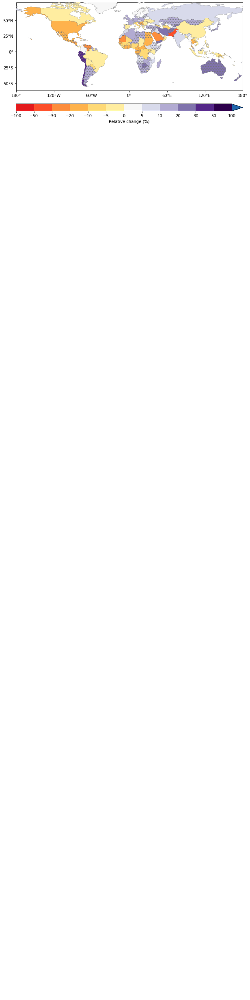

$\Delta$ 2.5th percentile: combi 4.0°C
50.755357162811535


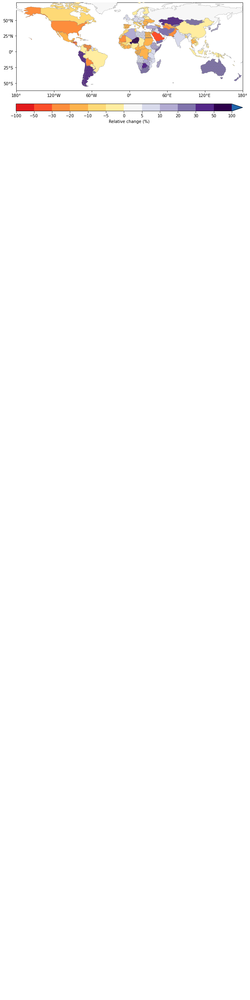

['FJI', 'TZA', 'CAN', 'USA', 'KAZ', 'UZB', 'PNG', 'IDN', 'ARG', 'CHL', 'COD', 'SOM', 'KEN', 'SDN', 'TCD', 'HTI', 'DOM', 'RUS', 'BHS', 'FLK', 'NOR', 'GRL', 'ATF', 'TLS', 'ZAF', 'LSO', 'MEX', 'URY', 'BRA', 'BOL', 'PER', 'COL', 'PAN', 'CRI', 'NIC', 'HND', 'SLV', 'GTM', 'BLZ', 'VEN', 'GUY', 'SUR', 'FRA', 'ECU', 'PRI', 'JAM', 'CUB', 'ZWE', 'BWA', 'NAM', 'SEN', 'MLI', 'MRT', 'BEN', 'NER', 'NGA', 'CMR', 'TGO', 'GHA', 'CIV', 'GIN', 'GNB', 'LBR', 'SLE', 'BFA', 'CAF', 'COG', 'GAB', 'GNQ', 'ZMB', 'MWI', 'MOZ', 'SWZ', 'AGO', 'BDI', 'ISR', 'LBN', 'MDG', 'GMB', 'TUN', 'DZA', 'JOR', 'ARE', 'QAT', 'KWT', 'IRQ', 'OMN', 'VUT', 'KHM', 'THA', 'LAO', 'MMR', 'VNM', 'PRK', 'KOR', 'MNG', 'IND', 'BGD', 'BTN', 'NPL', 'PAK', 'AFG', 'TJK', 'KGZ', 'TKM', 'IRN', 'SYR', 'ARM', 'SWE', 'BLR', 'UKR', 'POL', 'AUT', 'HUN', 'MDA', 'ROU', 'LTU', 'LVA', 'EST', 'DEU', 'BGR', 'GRC', 'TUR', 'ALB', 'HRV', 'CHE', 'LUX', 'BEL', 'NLD', 'PRT', 'ESP', 'IRL', 'NCL', 'SLB', 'NZL', 'AUS', 'LKA', 'CHN', 'TWN', 'ITA', 'DNK', 'GBR', 'ISL'

In [16]:
"""KCAL PER CAPITA make world map plot with color patch per country"""
# mean kcal, kcal at certain percentile, delta mean production, delta production at certain percentile
# requires cell above (loading stat data per country into dictionaries)
%autoreload 2
print(f'irrigation scheme: {irr}')
## settings for plots:
# 9 colors: https://colorbrewer2.org/?type=sequential&scheme=YlOrBr&n=9
colors9 = ['#f7fcfd','#e0ecf4','#bfd3e6','#9ebcda','#8c96c6','#8c6bb1','#88419d','#810f7c','#4d004b']
# colors12 = colors9 + ['#67001f', '#ae017e', '#dd1c77']
colors10 = colors9 + ['#dd1c77']
colors10_probability = ['#ffffcc','#ffeda0','#fed976','#feb24c','#fd8d3c','#fc4e2a','#e31a1c','#bd0026','#800026', '#630915'] # like  PR>1 scale
levels_abs = {'mean': # 10 levels
          {'mai-kcal': np.array([0, 5e4, 1e5, 2.5e5, 5e5, 7.5e5, 1e6, 2.5e6, 5e6, 7.5e6])*1e-6, #, 10e6, 12.5e6]), # mai: up to ca. 4e6 kcal pc
           'ric-kcal': np.array([0, 5e4, 1e5, 2.5e5, 5e5, 7.5e5, 1e6, 2.5e6, 5e6, 7.5e6])*1e-6, #, 10e6, 12.5e6]), # ric: up to ca. 5e6 kcal pc
           'soy-kcal': np.array([0, 5e4, 1e5, 2.5e5, 5e5, 7.5e5, 1e6, 2.5e6, 5e6, 7.5e6])*1e-6, #, 10e6, 12.5e6]), # soy: up to ca. 10e6 kcal pc
           'whe-kcal': np.array([0, 5e4, 1e5, 2.5e5, 5e5, 7.5e5, 1e6, 2.5e6, 5e6, 7.5e6])*1e-6, #, 10e6, 12.5e6]), # whe: up to ca. 10e6 kcal pc
           'combi-kcal': np.array([0, 5e4, 1e5, 2.5e5, 5e5, 7.5e5, 1e6, 2.5e6, 5e6, 7.5e6])*1e-6, #, 10e6, 12.5e6]), # combi: # up to ca. 16e6 kcal pc
          },
         }
levels_abs['0.025'] = levels_abs['mean']

colors12_div = ['#e31a1c', '#fc4e2a', '#fd8d3c', '#feb24c', '#fed976', '#ffeda0', # negative
                #'#7f3b08','#b35806','#e08214','#fdb863','#fee0b6', # negative
                '#f7f7f7','#d8daeb','#b2abd2','#8073ac','#542788','#2d004b'] # positive
levels_delta = {'mean': #
          {'mai-kcal': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'ric-kcal': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'soy-kcal': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'whe-kcal': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
           'combi-kcal': np.array([-1e6, -5e5, -1e5, -5e4, -1e4, 0, 1e4, 5e4, 1e5, 5e5, 1e6]),
          },
         }
levels_delta['0.025'] = levels_delta['mean']
colors11_div_max = colors12_div[1:]
colors13_div_max = colors12_div + ['#2166ac']
levels_rel = {'mean': #
          {'mai-kcal': np.array([-100, -50, -30, -20, -10, -5, 0, 5, 10, 20, 30, 50, 100]),
           'ric-kcal': np.array([-100, -50, -30, -20, -10, -5, 0, 5, 10, 20, 30, 50, 100]),
           'soy-kcal': np.array([-100, -50, -30, -20, -10, -5, 0, 5, 10, 20, 30, 50, 100]),
           'whe-kcal': np.array([-100, -50, -30, -20, -10, -5, 0, 5, 10, 20, 30, 50, 100]),
           'combi-kcal': np.array([-100, -50, -30, -20, -10, -5, 0, 5, 10, 20, 30, 50, 100]),
          },
         }
levels_rel['0.025'] = levels_rel['mean']

stats = ['mean', 0.025, "('count_rel_mean', -0.1)", "('count_rel_mean', -0.2)"]
country_array = np.array(df_self_dict[crops[0]].columns[5:])
crops = co.crop_types_kcal

show_title = False

print(stats)
# absolute kcal (reference bin)
gmt_bin = ref_bin
for crop in crops:
    if 'kcal' in crop:
        crop_unit = 'kcal'
    else:
        crop_unit = 't'
    for stat in stats:
        print(stat)
        colors = colors10
        
        if stat=='mean':
            cbar_label = 'Crop production (mio. kcal/capita/y)'
            title_str = 'Mean annual production: %s %1.1f°C'
            i_cntry_start = 3
            fn = f'map_countries_mean_{crop}_{10*gmt_bin:02.0f}_{stat}'
            levels = levels_abs[stat][crop]
            multipl = 1e-6
        elif isinstance(stat, float):
            cbar_label = 'Crop production (mio. kcal/capita/y)'
            title_str = f'{100*stat}th percentile: %s %1.1f°C'
            stat = str(stat)
            i_cntry_start = 4
            fn = f'map_countries_mean_kcalpc_{crop}_{10*gmt_bin:02.0f}_{100*float(stat)}th_p'
            levels = levels_abs[stat][crop]
            multipl = 1e-6
        elif 'count_rel_mean' in stat:
            dev_ = float(stat.split('-')[-1][:-1])
            title_str = f'Probability of production < {1-dev_:1.1f}*mean: %s %1.1f°C'
            i_cntry_start = 3
            fn = f'map_countries_prob_{crop}_{10*gmt_bin:02.0f}_{stat}'
            levels = np.array([0, .025, .05, .1, .15, .2, .3, .4, .5, .75]) # 10 levels
            colors = colors10_probability
            cbar_label = 'Probability'
            multipl = 1
        data_array = np.nan_to_num(df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) &
                                                             (df_self_dict[crop].bin==gmt_bin)].median()[i_cntry_start:].values) * multipl
        print(title_str %(crop.split('-')[0], gmt_bin))
        if show_title:
            title_str = title_str %(crop.split('-')[0], gmt_bin)
        else:
            title_str = ''
        fig_map, ax, countries_included, countries_excluded = \
            ups.plot_map_of_colored_countries(country_array, data_array, levels=levels,
                                              colors=colors, extent=None, figsize=(10,6),
                                              cbar_label=cbar_label,
                                              title=title_str, extend = 'max')
        fig_map.savefig(co.res_dir / 'maps' / f'{fn}_irr_{irr}.pdf', dpi=300, \
                        facecolor='w', edgecolor='w', orientation='portrait',
                        format='pdf', transparent=False, pad_inches=0.05, metadata=None)
        fig_map.savefig(co.res_dir / 'maps' /  f'{fn}_irr_{irr}.png', dpi=300, \
                        facecolor='w', edgecolor='w', orientation='portrait',
                        format='png', transparent=False, pad_inches=0.05, metadata=None)
        

# delta
for gmt_bin in gmt_bins[1:]:
    for crop in crops:
        for stat in stats:
            if stat=='mean':
                title_str = '$\Delta$ mean annual production: %s %1.1f°C'
                i_cntry_start = 3
                fn = f'map_countries_delta_kcalpc_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{stat}'
            elif isinstance(stat, float):
                title_str = f'$\Delta$ {100*stat}th percentile: %s %1.1f°C'
                stat = str(stat)
                i_cntry_start = 3
                fn = f'map_countries_delta_kcalpc_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{100*float(stat)}th_p'
            elif 'count_rel_mean' in stat:
                continue
            df_ref_ = df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) & (df_self_dict[crop].bin==ref_bin)].reset_index(drop=True).select_dtypes(np.number)
            df_ = df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) & (df_self_dict[crop].bin==gmt_bin)].reset_index(drop=True).select_dtypes(np.number)
            # subtraction: df - df_ref:
            df_result = df_.sub(df_ref_)
            data_array = np.nan_to_num(df_result.median()[i_cntry_start:].values)
            # divided at 0, as we are recording positive and negative changes
            ggcm_consistency_array = ((df_result > 0).sum() > .7*df_result.shape[0])[i_cntry_start:].values + ((df_result < 0).sum() > .7*df_result.shape[0])[i_cntry_start:].values
            print(title_str %(crop.split('-')[0], gmt_bin))
            if show_title:
                title_str = title_str %(crop.split('-')[0], gmt_bin)
            else:
                title_str = ''
            
            fig_map, ax, countries_included, countries_excluded = \
                ups.plot_map_of_colored_countries(country_array, data_array, levels=levels_delta[stat][crop],
                                                  colors=colors12_div, extent=None, figsize=(10,6),
                                                  title=title_str,
                                                  cbar_label='kcal / capita / year', extend='both',
                                                  hatches = ggcm_consistency_array)    
            fig_map.savefig(co.res_dir / 'maps' / f'{fn}_irr_{irr}.png', dpi=300, \
                        facecolor='w', edgecolor='w', orientation='portrait', papertype=None, format='png', \
                        transparent=False, bbox_inches='tight', pad_inches=0.05, frameon=None, metadata=None)
           
# relative (%)
for gmt_bin in gmt_bins[1:]:
    for crop in crops:
        for stat in stats:
            if stat=='mean':
                title_str = '$\Delta$ mean production: %s %1.1f°C'
                i_cntry_start = 3
                fn = f'map_countries_rel_delta_kcal_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{stat}'
            elif isinstance(stat, float):
                title_str = f'$\Delta$ {100*stat}th percentile: %s %1.1f°C'
                stat = str(stat)
                i_cntry_start = 3
                fn = f'map_countries_rel_delta_kcal_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{100*float(stat)}th_p'
            elif 'count_rel_mean' in stat:
                continue
            
            df_ref_ = df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) & (df_self_dict[crop].bin==ref_bin)].reset_index(drop=True).select_dtypes(np.number)
            df_ = df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) & (df_self_dict[crop].bin==gmt_bin)].reset_index(drop=True).select_dtypes(np.number)
            # rel. diff: (df_ - df_ref_) / df_ref_:
            df_result = df_.sub(df_ref_).div(df_ref_)
            data_array = 100 * np.nan_to_num(df_result.median()[i_cntry_start:].values)
            ggcm_consistency_array = ((df_result > 0).sum() > .7*df_result.shape[0])[i_cntry_start:].values + ((df_result < 0).sum() > .7*df_result.shape[0])[i_cntry_start:].values
            
            print(title_str %(crop.split('-')[0], gmt_bin))
            print(max(data_array))
            data_array[data_array == np.inf] = np.nan
            data_array[data_array == -np.inf] = np.nan
            
            if show_title:
                title_str = title_str %(crop.split('-')[0], gmt_bin)
            else:
                title_str = ''

            fig_map, ax, countries_included, countries_excluded = \
                ups.plot_map_of_colored_countries(country_array, data_array, levels=levels_rel[stat][crop],
                                                  colors=colors13_div_max, extent=None, figsize=(10,6),
                                                  title=title_str, 
                                                  cbar_label='Relative change (%)', extend='max',
                                                  hatches = ggcm_consistency_array) 
            fig_map.savefig(co.res_dir / 'maps' / f'{fn}_irr_{irr}.png', dpi=300, \
                        facecolor='w', edgecolor='w', orientation='portrait', papertype=None, format='png', \
                        transparent=False, bbox_inches='tight', pad_inches=0.05, frameon=None, metadata=None)

# probability ratio (%)   
print(countries_included)
print(countries_excluded)

## B.5 World maps showing probability ratio (PR) per country

irrigation scheme: None
['cygma1p74' 'simplace-lintul5' 'isam' 'pdssat' 'pepic' 'lpjml'
 'epic-iiasa' 'promet' 'crover']
0.025
1.0
PR 2.5th percentile: mai 0.5°C


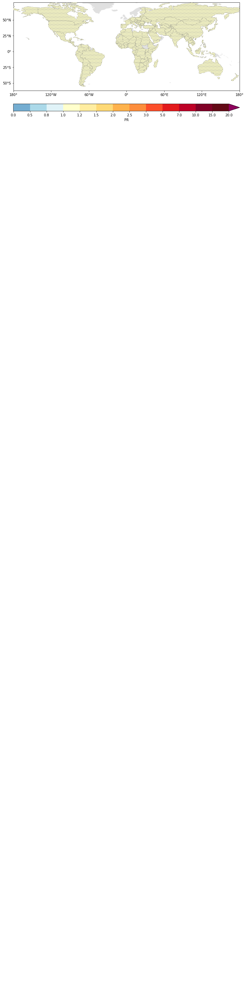

Probability 2.5th percentile: mai 0.5°C


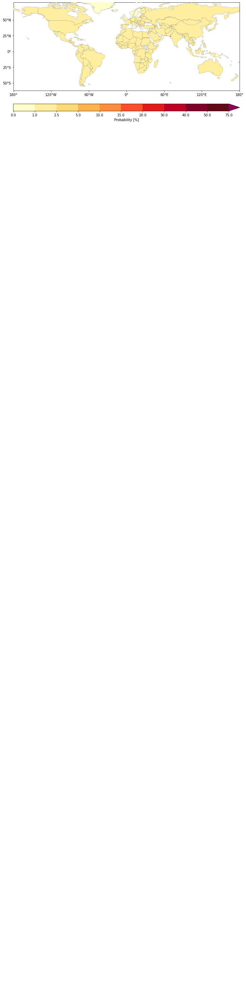

('count_rel_mean', -0.1)
1.0
PR production < 0.9*mean: mai 0.5°C


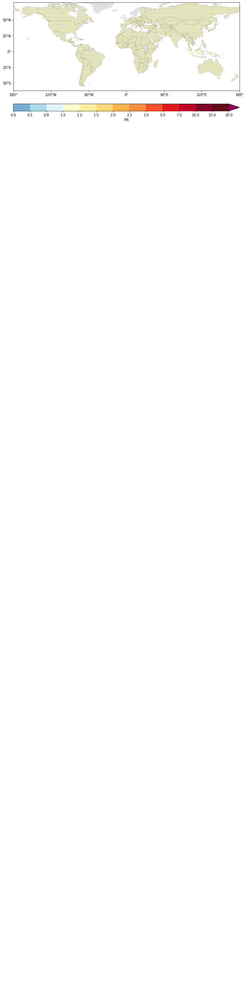

Probability production < 0.9*mean: mai 0.5°C


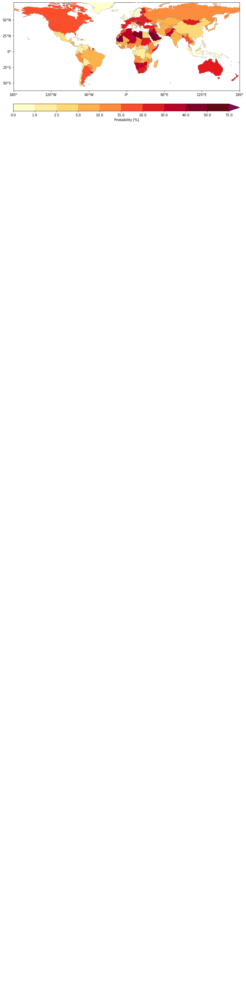

0.025
1.0
PR 2.5th percentile: ric 0.5°C


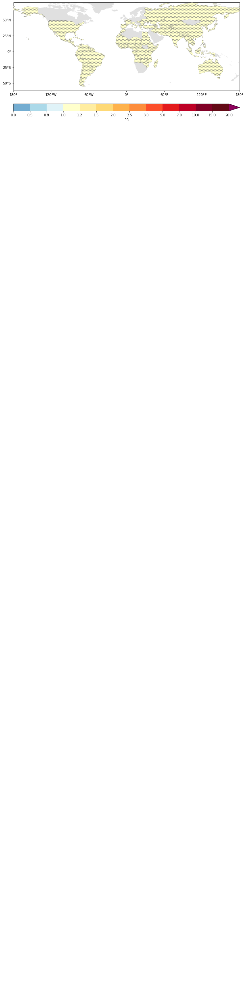

Probability 2.5th percentile: ric 0.5°C


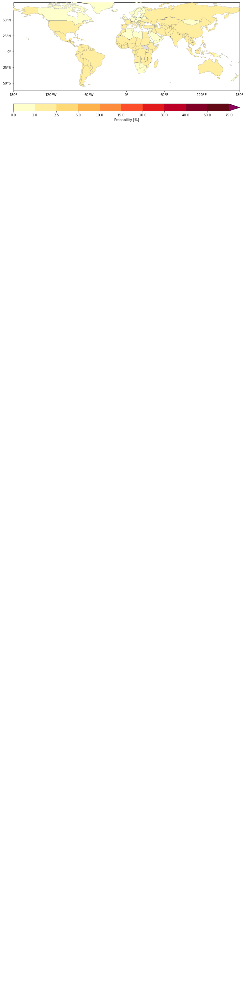

('count_rel_mean', -0.1)
1.0
PR production < 0.9*mean: ric 0.5°C


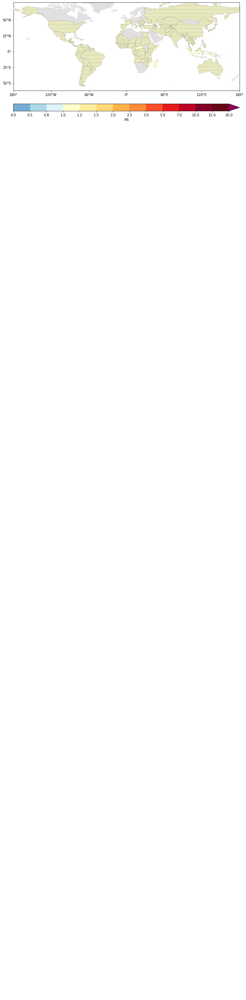

Probability production < 0.9*mean: ric 0.5°C


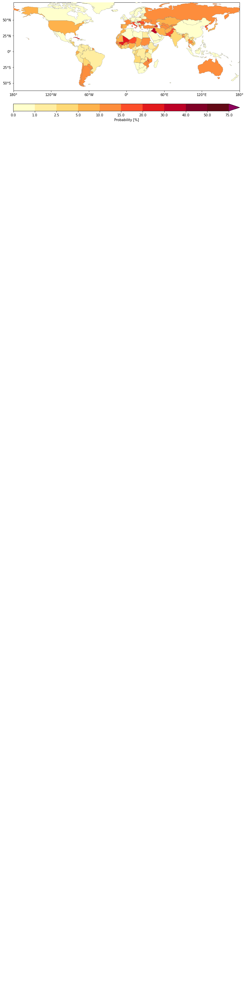

0.025
nan
PR 2.5th percentile: soy 0.5°C


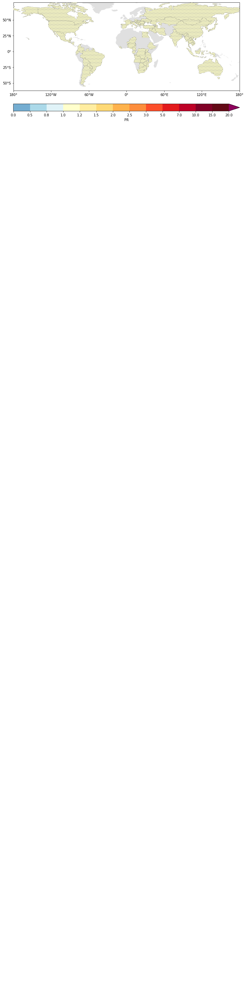

Probability 2.5th percentile: soy 0.5°C


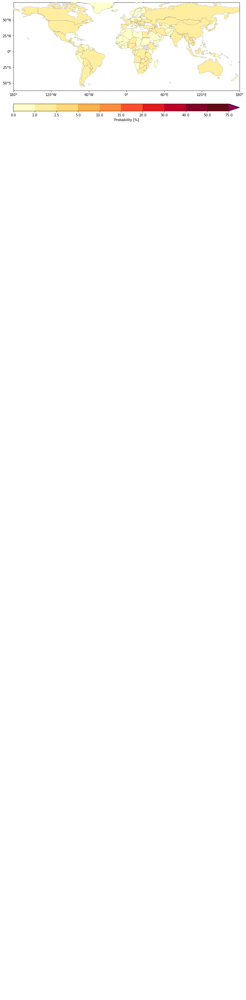

('count_rel_mean', -0.1)
nan
PR production < 0.9*mean: soy 0.5°C


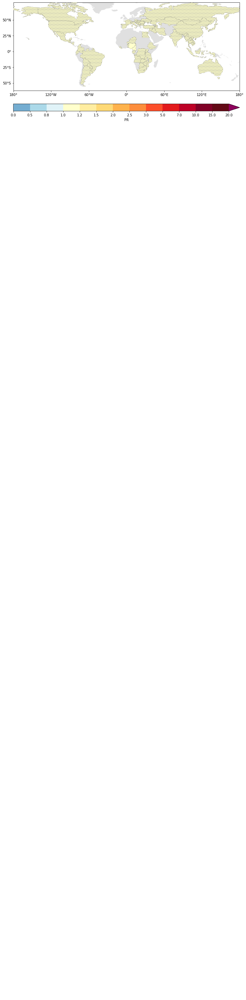

Probability production < 0.9*mean: soy 0.5°C


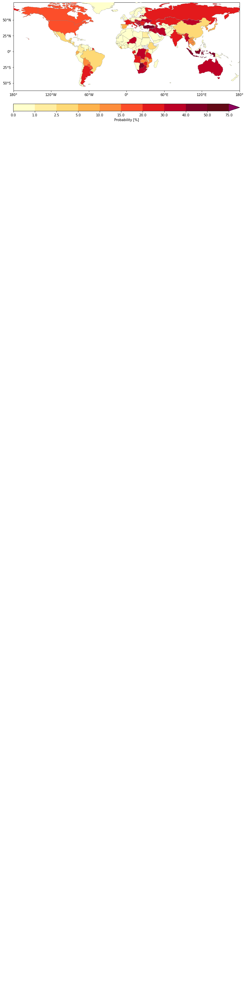

0.025
1.0
PR 2.5th percentile: whe 0.5°C


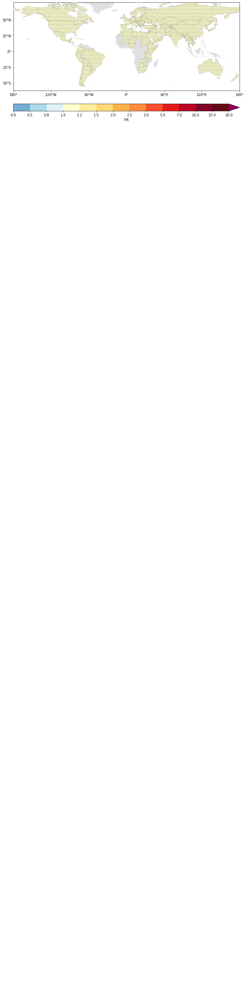

Probability 2.5th percentile: whe 0.5°C


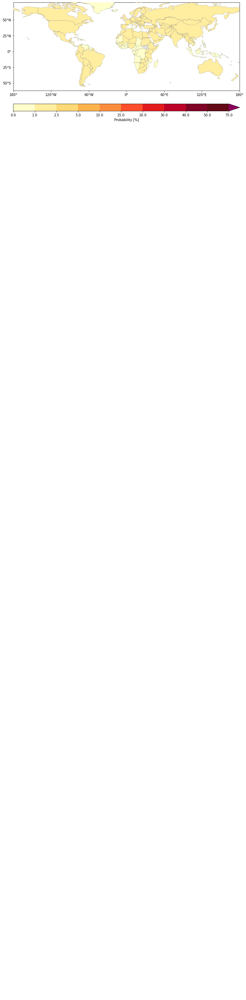

('count_rel_mean', -0.1)
1.0
PR production < 0.9*mean: whe 0.5°C


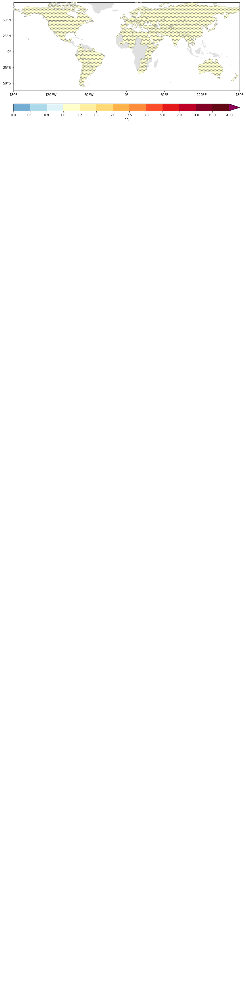

Probability production < 0.9*mean: whe 0.5°C


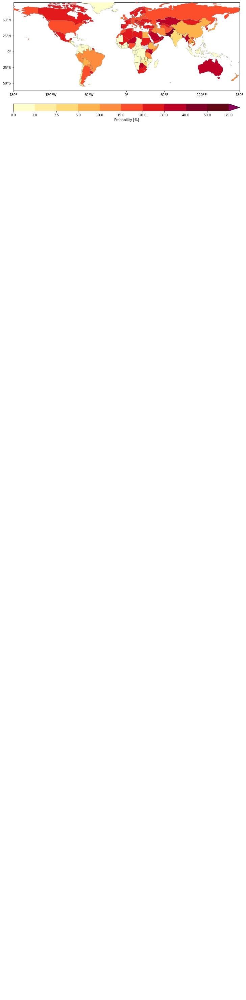

0.025
1.0
PR 2.5th percentile: combi 0.5°C


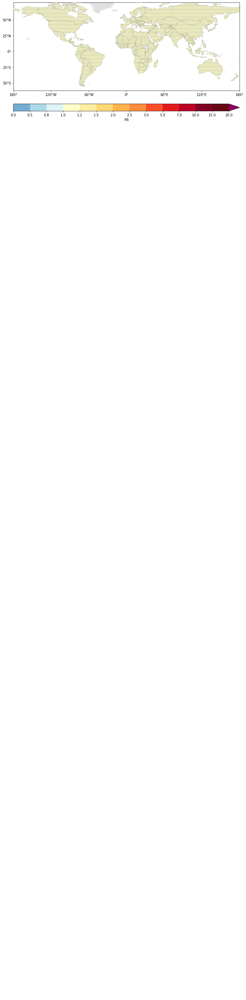

Probability 2.5th percentile: combi 0.5°C


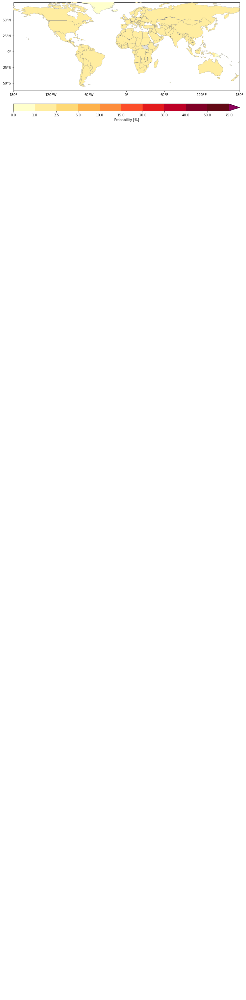

('count_rel_mean', -0.1)
1.0
PR production < 0.9*mean: combi 0.5°C


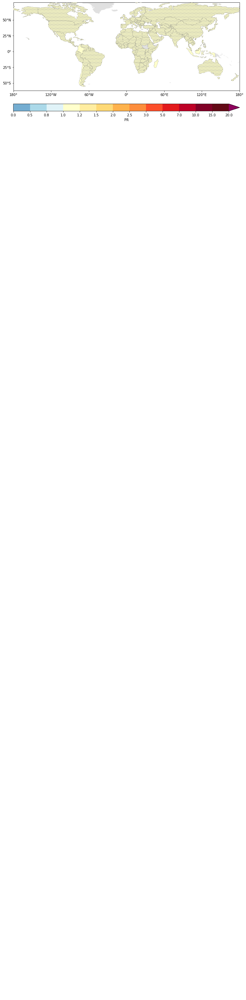

Probability production < 0.9*mean: combi 0.5°C


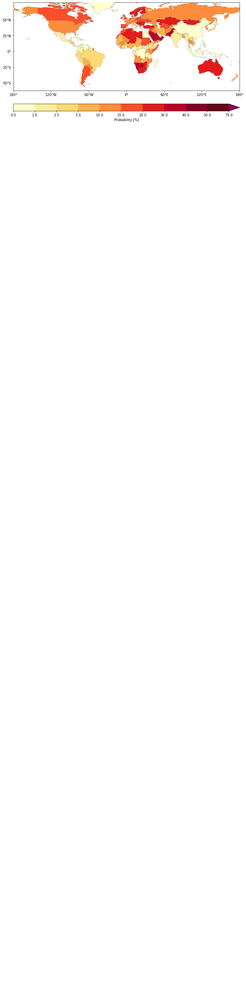

0.025
38.7198879551821
PR 2.5th percentile: mai 2.0°C


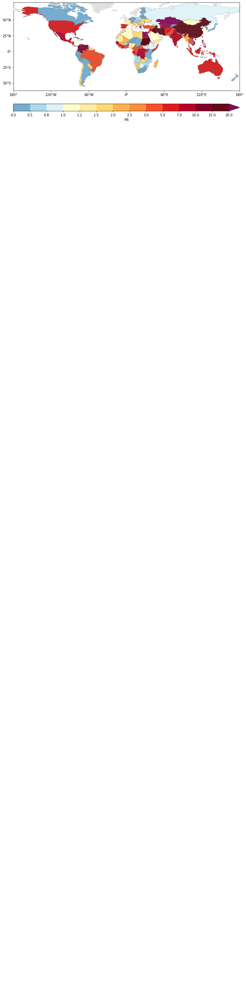

Probability 2.5th percentile: mai 2.0°C


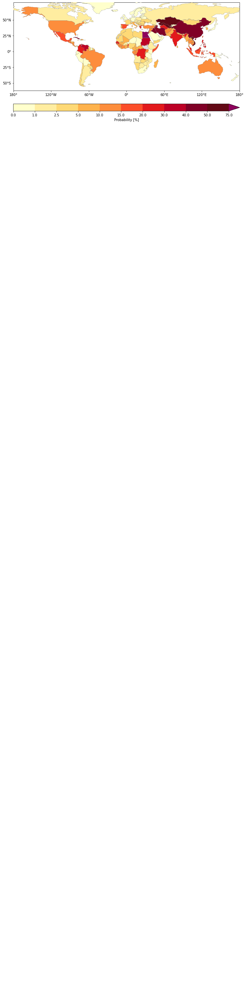

('count_rel_mean', -0.1)
2.104341736694682
PR production < 0.9*mean: mai 2.0°C


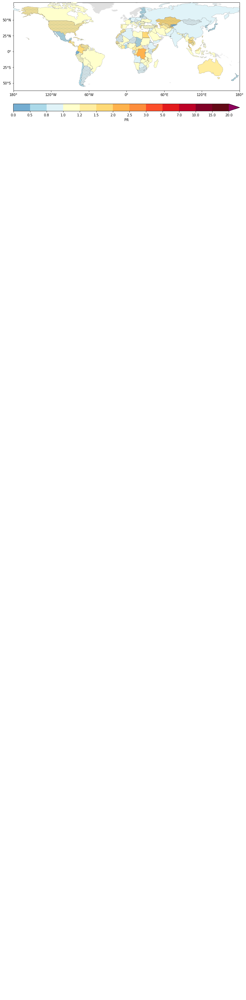

Probability production < 0.9*mean: mai 2.0°C


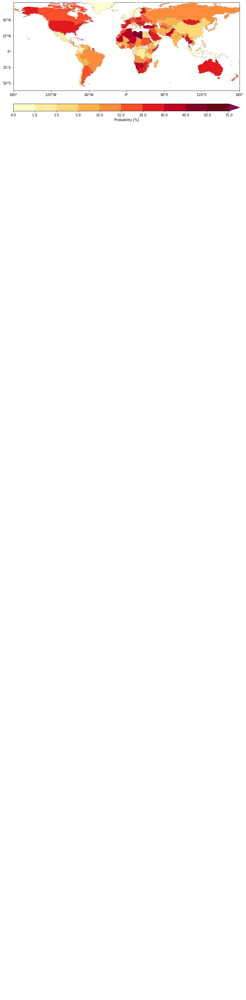

0.025
13.018860877684414
PR 2.5th percentile: ric 2.0°C


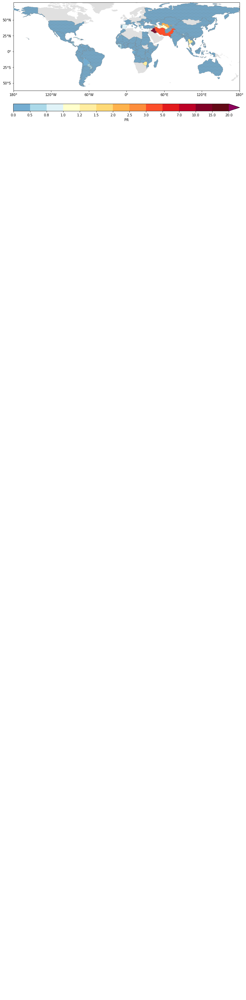

Probability 2.5th percentile: ric 2.0°C


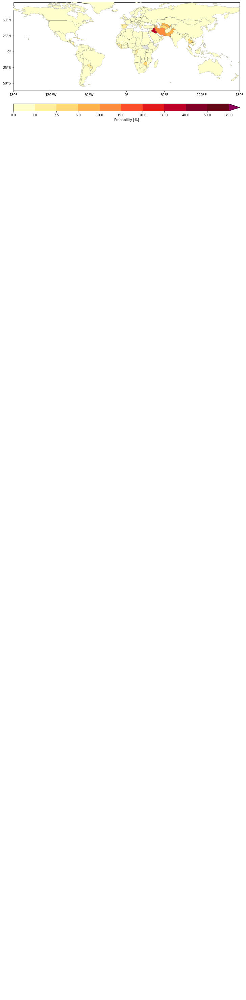

('count_rel_mean', -0.1)
2.1690907132083552
PR production < 0.9*mean: ric 2.0°C


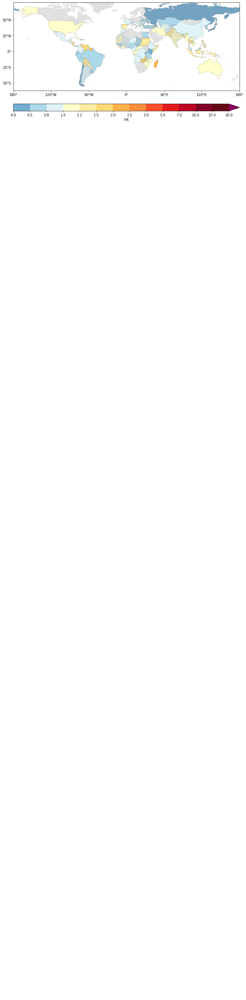

Probability production < 0.9*mean: ric 2.0°C


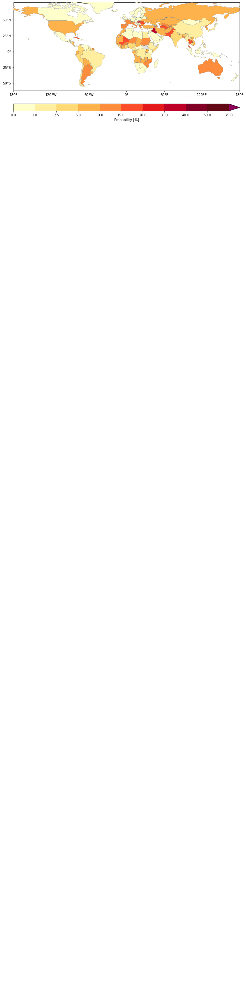

0.025
nan
PR 2.5th percentile: soy 2.0°C


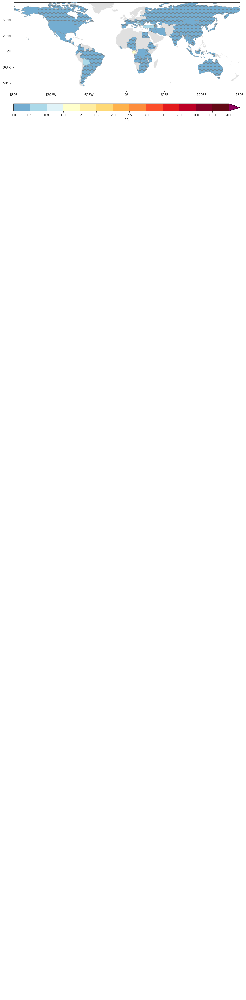

Probability 2.5th percentile: soy 2.0°C


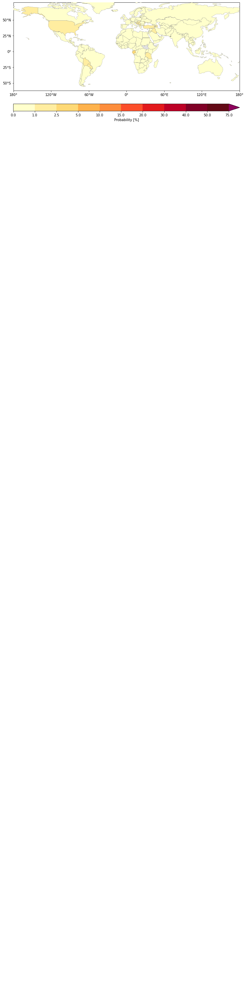

('count_rel_mean', -0.1)
nan
PR production < 0.9*mean: soy 2.0°C


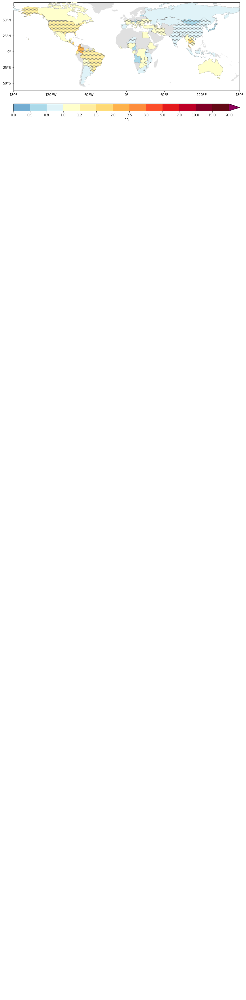

Probability production < 0.9*mean: soy 2.0°C


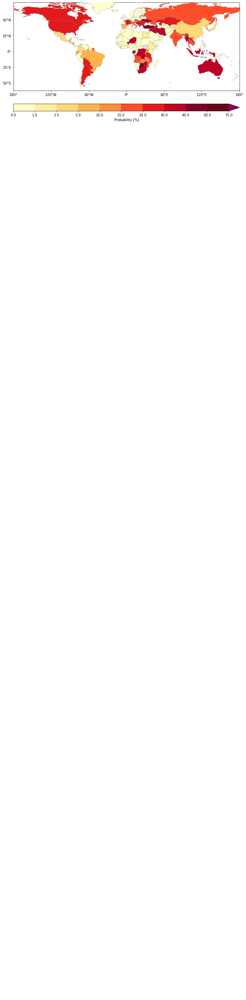

0.025
25.027637721755386
PR 2.5th percentile: whe 2.0°C


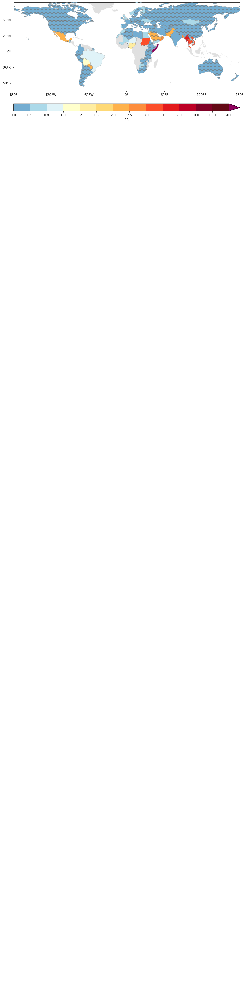

Probability 2.5th percentile: whe 2.0°C


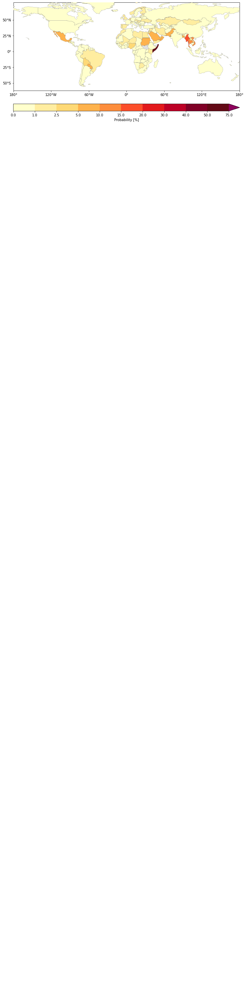

('count_rel_mean', -0.1)
2.525210084033618
PR production < 0.9*mean: whe 2.0°C


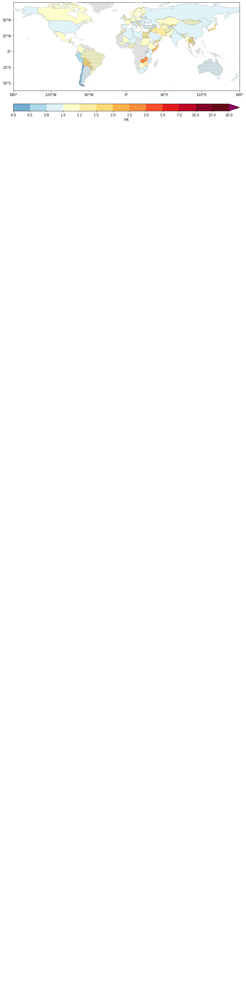

Probability production < 0.9*mean: whe 2.0°C


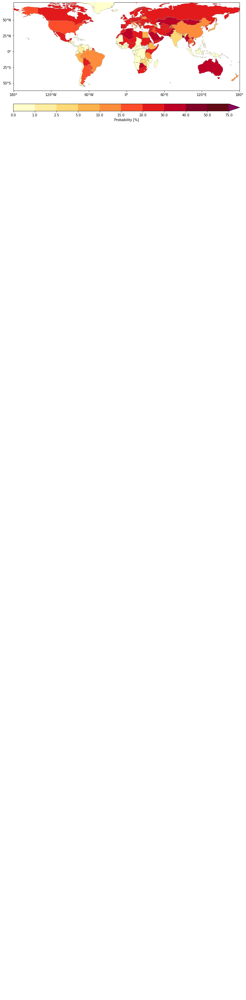

0.025
19.135480859010286
PR 2.5th percentile: combi 2.0°C


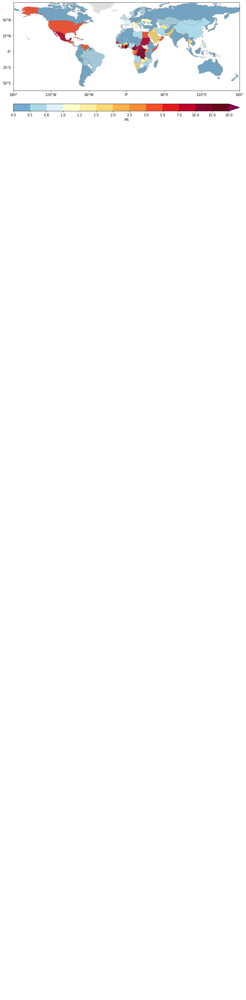

Probability 2.5th percentile: combi 2.0°C


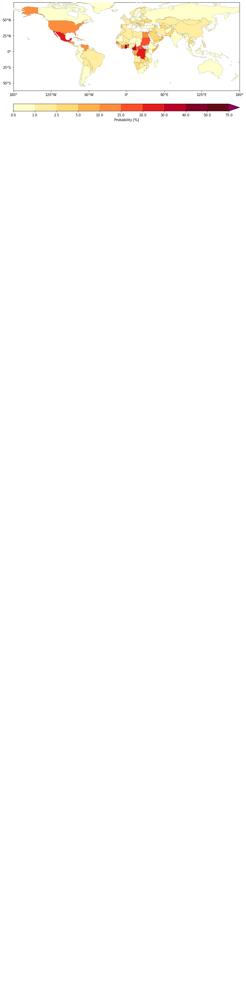

('count_rel_mean', -0.1)
2.4316837846249624
PR production < 0.9*mean: combi 2.0°C


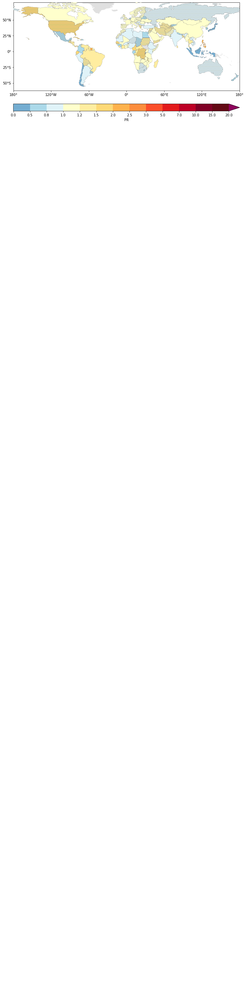

Probability production < 0.9*mean: combi 2.0°C


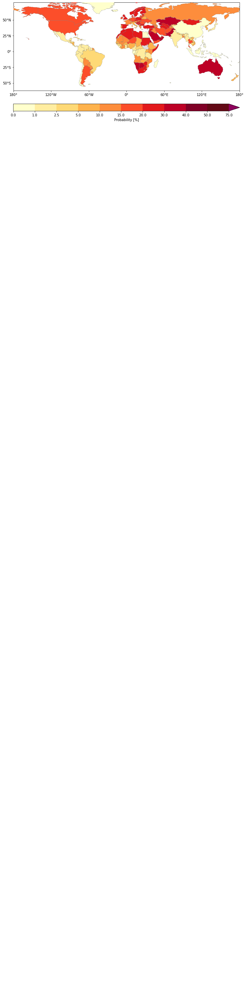

['FJI', 'TZA', 'CAN', 'USA', 'KAZ', 'UZB', 'PNG', 'IDN', 'ARG', 'CHL', 'COD', 'SOM', 'KEN', 'SDN', 'TCD', 'HTI', 'DOM', 'RUS', 'BHS', 'FLK', 'NOR', 'GRL', 'ATF', 'TLS', 'ZAF', 'LSO', 'MEX', 'URY', 'BRA', 'BOL', 'PER', 'COL', 'PAN', 'CRI', 'NIC', 'HND', 'SLV', 'GTM', 'BLZ', 'VEN', 'GUY', 'SUR', 'FRA', 'ECU', 'PRI', 'JAM', 'CUB', 'ZWE', 'BWA', 'NAM', 'SEN', 'MLI', 'MRT', 'BEN', 'NER', 'NGA', 'CMR', 'TGO', 'GHA', 'CIV', 'GIN', 'GNB', 'LBR', 'SLE', 'BFA', 'CAF', 'COG', 'GAB', 'GNQ', 'ZMB', 'MWI', 'MOZ', 'SWZ', 'AGO', 'BDI', 'ISR', 'LBN', 'MDG', 'GMB', 'TUN', 'DZA', 'JOR', 'ARE', 'QAT', 'KWT', 'IRQ', 'OMN', 'VUT', 'KHM', 'THA', 'LAO', 'MMR', 'VNM', 'PRK', 'KOR', 'MNG', 'IND', 'BGD', 'BTN', 'NPL', 'PAK', 'AFG', 'TJK', 'KGZ', 'TKM', 'IRN', 'SYR', 'ARM', 'SWE', 'BLR', 'UKR', 'POL', 'AUT', 'HUN', 'MDA', 'ROU', 'LTU', 'LVA', 'EST', 'DEU', 'BGR', 'GRC', 'TUR', 'ALB', 'HRV', 'CHE', 'LUX', 'BEL', 'NLD', 'PRT', 'ESP', 'IRL', 'NCL', 'SLB', 'NZL', 'AUS', 'LKA', 'CHN', 'TWN', 'ITA', 'DNK', 'GBR', 'ISL'

In [6]:
"""Probability ratio (PR) per country world maps"""
print(f'irrigation scheme: {irr}')
crops = co.crop_types_kcal
stats = [0.025, "('count_rel_mean', -0.1)"] #, "('count_rel_mean', -0.2)"]
country_array = np.array(df_self_dict[crops[0]].columns[5:])
gmt_bins = [0.5, 2.0] # [0.5, 1.5, 2.0, 3.0, 4.0]

show_title = False

levels = dict()
colors = dict()
_, _, levels['PR'], colors['PR'] = ups.get_colormap_pr(levels=None, pal=None, extend=None)
levels['PR'] = levels['PR'][:-1]
levels['PP'] = 100*np.array([0, 0.01, .025, .05, .1, .15, .2, .3, .4, .5, .75]) # 11 levels
colors['PP'] = ['#ffffcc','#ffeda0','#fed976','#feb24c','#fd8d3c','#fc4e2a','#e31a1c','#bd0026','#800026', '#630915', '#8e025c'] # colors10_probability plus dark violett

metrics = ('PR', 'PP')

print(df_self_dict['mai-kcal'].ggcm.unique())

for gmt_bin in gmt_bins:
    for crop in crops:
        for stat in stats:
            print(stat)
            title_str = dict()
            if isinstance(stat, str) and 'count_rel_mean' in stat:
                dev_ = float(stat.split('-')[-1][:-1])
                i_cntry_start = 3
                title_str['PR'] = f'PR production < {1-dev_:1.1f}*mean: %s %1.1f°C'
                fn_pr = f'map_countries_PR_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{stat}'
                title_str['PP'] = f'Probability production < {1-dev_:1.1f}*mean: %s %1.1f°C'
                fn_pp = f'map_countries_PP_{crop}_{10*gmt_bin:02.0f}_{stat}'

                df_ref_ = df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) & (df_self_dict[crop].bin==ref_bin)].reset_index(drop=True).select_dtypes(np.number)
                df_ = df_self_dict[crop].loc[(df_self_dict[crop].stat==stat) & (df_self_dict[crop].bin==gmt_bin)].reset_index(drop=True).select_dtypes(np.number)
            elif isinstance(stat, float) or isinstance(stat, int):
                stat = str(stat)
                i_cntry_start = 3
                fn_pr = f'map_countries_PR_{crop}_{10*gmt_bin:02.0f}_rel2bin_{10*ref_bin:02.0f}_{100*float(stat)}th_p'
                title_str['PR'] = f'PR {100*float(stat):1.1f}th percentile: %s %1.1f°C'
                fn_pp = f'map_countries_PP_{crop}_{10*gmt_bin:02.0f}_{100*float(stat)}th_p'
                title_str['PP'] = f'Probability {100*float(stat):1.1f}th percentile: %s %1.1f°C'               
                df_ref_ = df_rel_dict[crop].loc[(df_rel_dict[crop].stat==stat) & (df_rel_dict[crop].bin==ref_bin)].reset_index(drop=True).select_dtypes(np.number)
                df_ = df_rel_dict[crop].loc[(df_rel_dict[crop].stat==stat) & (df_rel_dict[crop].bin==gmt_bin)].reset_index(drop=True).select_dtypes(np.number)
            else:
                continue

            # Probability ratio: df_  / df_ref_:
            df_pr = df_.div(df_ref_)
            data_array = np.nan_to_num(df_pr.median()[i_cntry_start:].values)
            data_array_ref = np.nan_to_num(df_ref_.median()[i_cntry_start:].values)
            data_array_bin = np.nan_to_num(df_.median()[i_cntry_start:].values)
            # handle data where PR at ref is 0 and bin is not 0:
            for i, _ in enumerate(data_array):
                if (data_array_ref[i] == 0) and (data_array_bin[i] == 0):
                    data_array[i] = np.nan
                elif (data_array_ref[i] == 0) and (data_array_bin[i] > 0):
                    data_array[i] = 100
            # divide needs to be set to 1 for PR!
            ggcm_consistency_array = ((df_pr > 1).sum() > .7*df_pr.shape[0])[i_cntry_start:].values + ((df_pr <= 1).sum() > .7*df_pr.shape[0])[i_cntry_start:].values
            
            print(max(data_array))
            # PROBLEM for mean <0.9*mean: some models have 0 probability at 0.5°C, their PR is excluded so far by setting inf to nan:
            data_array[data_array == np.inf] = np.nan
            data_array[data_array == -np.inf] = np.nan
            for metric in metrics:
                print(title_str[metric] %(crop.split('-')[0], gmt_bin))
                if show_title:
                    title_str_single = title_str[metric] %(crop.split('-')[0], gmt_bin)
                else:
                    title_str_single = ''
                if metric == 'PR':

                    fig_map, ax, countries_included, countries_excluded = \
                        ups.plot_map_of_colored_countries(country_array, data_array, levels=levels['PR'],
                                                          colors=colors['PR'], extent=None, figsize=(10,6),
                                                          title=title_str_single, 
                                                          cbar_label='PR', extend='max',
                                                          hatches = ggcm_consistency_array) 

                    fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_PR' / f'{fn_pr}_irr_{irr}.png', dpi=300, \
                                    facecolor='w', edgecolor='w', orientation='portrait',
                                    format='png', transparent=False, pad_inches=0.05, metadata=None)
                    fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_PR' / f'{fn_pr}_irr_{irr}.pdf', dpi=300, \
                                    facecolor='w', edgecolor='w', orientation='portrait',
                                    format='pdf', transparent=False, pad_inches=0.05, metadata=None)
                elif metric == 'PP':
                    fig_map, ax, countries_included, countries_excluded = \
                        ups.plot_map_of_colored_countries(country_array, 100*data_array_bin, levels=levels['PP'],
                                                          colors=colors['PP'], extent=None, figsize=(10,6),
                                                          title=title_str_single, 
                                                          cbar_label='Probability [%]', extend='max',
                                                          hatches = None) 
                    fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_PP' / f'{fn_pp}_irr_{irr}.png', dpi=300, \
                                facecolor='w', edgecolor='w', orientation='portrait', format='png', \
                                transparent=False, pad_inches=0.05, metadata=None)             
                    fig_map.savefig(co.res_dir / 'maps' / 'maps_countries_PP' / f'{fn_pp}_irr_{irr}.pdf', dpi=300, \
                                facecolor='w', edgecolor='w', orientation='portrait', format='pdf', \
                                transparent=False, pad_inches=0.05, metadata=None)     

            
print(countries_included)
print(countries_excluded)

## C.1 Irrigated production (%) per crop type and country
world maps

mai


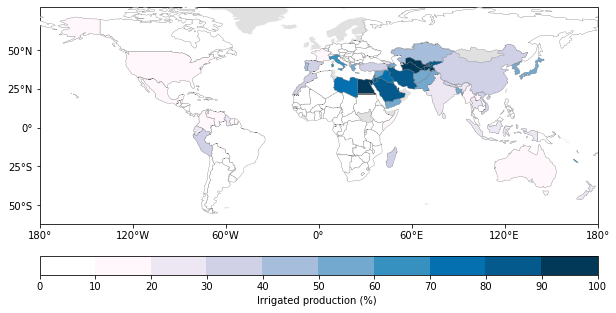

/Users/eberenzs/opt/anaconda3/envs/pyvis/lib/python3.6/site-packages/ipykernel_launcher.py:41: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.


ric


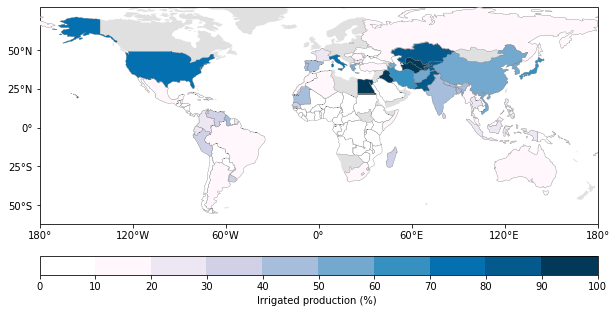

soy


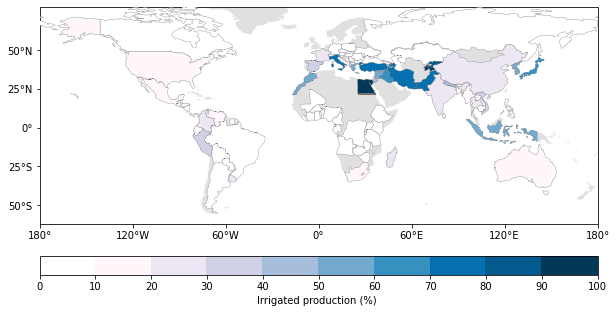

whe


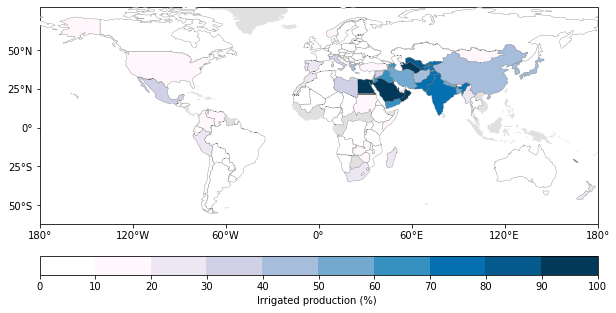

combi-kcal


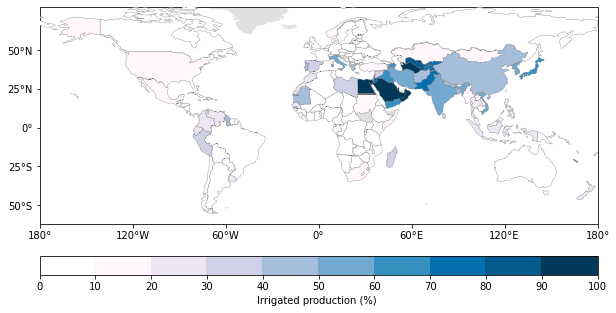

In [8]:
"""plot irrigation level per country and crop"""
directory = Path('/Users/eberenzs/Documents/Projects/crop_analysis/data/ISIMIP3b/output/Impact/')
fn = 'baseline_exposure.csv'
show_titletitle = False
crops = co.crop_types + ['combi-kcal']

KCAL_PER_TON = {'mai': 3.56e6, 'ric': 2.80e6, 'whe': 3.34e6, 'soy': 3.35e6}
levels = np.array([0, 10,  20,  30,  40,  50,  60,  70,  80,  90, 100])
colors9_pubu = ['w', '#fff7fb','#ece7f2','#d0d1e6','#a6bddb','#74a9cf','#3690c0','#0570b0','#045a8d','#023858']
df = pd.read_csv(directory / fn, encoding="ISO-8859-1", header=0)
for crop in crops:
    print(crop)
    if crop in co.crop_types:
        new_row = df.loc[(df['Crop']==crop) & (df['Crop Production']=='Exposure_firr')].max()
        exp_row = df.loc[(df['Crop']==crop) & (df['Crop Production']=='Exposure')].max()


    elif crop == 'combi-kcal':
        new_row = df.loc[df['Crop Production']=='Exposure_firr'].sum()
        exp_row = df.loc[df['Crop Production']=='Exposure'].sum()
        new_row['Crop'] = crop
    exp_array = np.array(exp_row.values[2:]).astype('float')
    exp_array[exp_array == 0] = np.nan
    new_row['Crop Production'] = 'irr_ratio'
    df = df.append(new_row, ignore_index=True)
    df.loc[(df['Crop']==crop) & (df['Crop Production']=='irr_ratio'), df.columns[2]:] = np.divide(np.array(new_row.values[2:]), exp_array)
    if show_title:
        title_str = 'Irrigation level: %s' %(crop.split('-')[0])
    else:
        title_str = ''
    fig_map, ax, countries_included, countries_excluded = \
                ups.plot_map_of_colored_countries(np.array(df.columns[2:]),
                                                  data_array=100 * np.array(df.loc[(df['Crop']==crop) & (df['Crop Production']=='irr_ratio'), df.columns[2]:].values[0]),
                                                  levels=levels,
                                                  colors=colors9_pubu, extent=None, figsize=(10,6),
                                                  title=title_str, 
                                                  cbar_label='Irrigated production (%) ', extend='neither',
                                                  hatches = None) 
    fig_map.savefig(co.res_dir / 'maps' / f'irrigation_level_countries_{crop}.png', dpi=300, \
                        facecolor='w', edgecolor='w', orientation='portrait', papertype=None, format='png', \
                        transparent=False, bbox_inches='tight', pad_inches=0.05, frameon=None, metadata=None)
    
    
df.to_csv(directory / 'baseline_exposure_irr_level.csv', index=False)